# Netflix Data: Cleaning, Analysis and visualization

In [2]:
# importing important libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
pd.set_option("Display.max_columns",None)

In [4]:
df=pd.read_csv("Netflix1.csv")

In [5]:
pd.set_option("display.max_rows",None)

In [6]:
df.sample(4)

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
2772,s3684,Movie,Cristina,Michèle Ohayon,United States,7/4/2019,2016,TV-14,40 min,Documentaries
3415,s4719,Movie,Like Father,Lauren Miller Rogen,United States,8/3/2018,2018,TV-MA,104 min,"Comedies, Dramas"
1134,s1165,Movie,Ni de coña,Fernando Ayllón,Spain,3/26/2021,2020,TV-MA,97 min,"Comedies, International Movies"
3668,s5078,TV Show,Godzilla,"Kobun Shizuno, Hiroyuki Seshita",Japan,1/17/2018,2017,TV-14,1 Season,TV Shows


In [7]:
df.shape

(8790, 10)

In [8]:
df1=df.copy()

In [9]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8790 entries, 0 to 8789
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8790 non-null   object
 1   type          8790 non-null   object
 2   title         8790 non-null   object
 3   director      8790 non-null   object
 4   country       8790 non-null   object
 5   date_added    8790 non-null   object
 6   release_year  8790 non-null   int64 
 7   rating        8790 non-null   object
 8   duration      8790 non-null   object
 9   listed_in     8790 non-null   object
dtypes: int64(1), object(9)
memory usage: 686.8+ KB


In [10]:
df1.isnull().sum()

show_id         0
type            0
title           0
director        0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
dtype: int64

In [11]:
df1.duplicated().sum()

0

In [12]:
# checking the unique values of each features

In [13]:
df1.columns

Index(['show_id', 'type', 'title', 'director', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in'],
      dtype='object')

# show_id

In [15]:
len(df1["show_id"].unique())

8790

In [16]:
# insight:- their was no duplicate values in show_id columns.

# type

In [18]:
df1["type"].value_counts()

type
Movie      6126
TV Show    2664
Name: count, dtype: int64

# title

In [20]:
len(df1["title"].unique())

8787

In [21]:
# conclusion:- their was duplicate value 

In [22]:
df1["title"].value_counts()

title
9-Feb                                                                                                       2
15-Aug                                                                                                      2
22-Jul                                                                                                      2
Dick Johnson Is Dead                                                                                        1
SGT. Will Gardner                                                                                           1
Sex and the City 2                                                                                          1
Sex and the City: The Movie                                                                                 1
Sex Doll                                                                                                    1
Sexo, Pudor y Lagrimas                                                                                      1
Shah

In [23]:
df1[df1["title"]=="9-Feb"]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
393,s3997,TV Show,9-Feb,Not Given,Pakistan,3/20/2019,2018,TV-14,1 Season,"International TV Shows, TV Dramas"
537,s5965,TV Show,9-Feb,Not Given,Pakistan,3/20/2019,2018,TV-14,1 Season,"International TV Shows, TV Dramas"


In [24]:
df1[df1["title"]=="15-Aug"]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
2925,s3963,Movie,15-Aug,Swapnaneel Jayakar,India,3/29/2019,2019,TV-14,124 min,"Comedies, Dramas, Independent Movies"
4261,s5967,Movie,15-Aug,Swapnaneel Jayakar,India,3/29/2019,2019,TV-14,124 min,"Comedies, Dramas, Independent Movies"


In [25]:
df1[df1["title"]=="22-Jul"]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
3285,s4523,Movie,22-Jul,Paul Greengrass,Norway,10/10/2018,2018,R,144 min,"Dramas, Thrillers"
4260,s5966,Movie,22-Jul,Paul Greengrass,Norway,10/10/2018,2018,R,144 min,"Dramas, Thrillers"


# Analys:- we got three duplicate values whose index value is 537,4261,4260

In [27]:
df1.iloc[[537,4261,4260],:]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
537,s5965,TV Show,9-Feb,Not Given,Pakistan,3/20/2019,2018,TV-14,1 Season,"International TV Shows, TV Dramas"
4261,s5967,Movie,15-Aug,Swapnaneel Jayakar,India,3/29/2019,2019,TV-14,124 min,"Comedies, Dramas, Independent Movies"
4260,s5966,Movie,22-Jul,Paul Greengrass,Norway,10/10/2018,2018,R,144 min,"Dramas, Thrillers"


In [28]:
df1.drop(index=[537,4261,4260],inplace=True)

In [29]:
np.sort(df1["title"].value_counts())[::-1]

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [30]:
# we will deal with director after few columns

# country

In [32]:
df1["country"].value_counts().head(5)

country
United States     3240
India             1056
United Kingdom     638
Pakistan           420
Not Given          287
Name: count, dtype: int64

In [33]:
abc=df1[df1["country"]=="Not Given"].iloc[:,3:9].duplicated()[df1[df1["country"]=="Not Given"].iloc[:,3:9].duplicated() == True]

In [34]:
df1.loc[abc.index,:]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
343,s238,Movie,Boomika (Hindi),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
344,s239,Movie,Boomika (Malayalam),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
345,s240,Movie,Boomika (Telugu),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
837,s760,Movie,Fireplace 4K: Classic Crackling Fireplace from...,George Ford,Not Given,6/4/2021,2015,TV-G,60 min,Movies
2103,s2595,Movie,Thomas & Friends: Marvelous Machinery: World o...,Joey So,Not Given,5/1/2020,2020,TV-Y,23 min,Children & Family Movies
2104,s2596,Movie,Thomas & Friends: Thomas and the Royal Engine,Joey So,Not Given,5/1/2020,2020,TV-Y,23 min,Children & Family Movies
2244,s2813,Movie,Digs & Discoveries: Mines of Mystery,Joey So,Not Given,3/15/2020,2019,TV-Y,23 min,Children & Family Movies
2250,s2815,Movie,Steam Team to the Rescue,Joey So,Not Given,3/15/2020,2019,TV-Y,23 min,Children & Family Movies


In [35]:
df1[df1["director"].str.contains("Rathindran R Prasad")]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
342,s237,Movie,Boomika,Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
343,s238,Movie,Boomika (Hindi),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
344,s239,Movie,Boomika (Malayalam),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
345,s240,Movie,Boomika (Telugu),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
409,s298,TV Show,Navarasa,"Bejoy Nambiar, Priyadarshan, Karthik Narain, V...",India,8/6/2021,2021,TV-MA,1 Season,TV Shows


In [36]:
df1[df1["director"].str.contains("Rathindran")]

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
342,s237,Movie,Boomika,Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
343,s238,Movie,Boomika (Hindi),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
344,s239,Movie,Boomika (Malayalam),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
345,s240,Movie,Boomika (Telugu),Rathindran R Prasad,Not Given,8/23/2021,2021,TV-14,122 min,"Horror Movies, International Movies, Thrillers"
409,s298,TV Show,Navarasa,"Bejoy Nambiar, Priyadarshan, Karthik Narain, V...",India,8/6/2021,2021,TV-MA,1 Season,TV Shows


In [37]:
df1.iloc[342:346,4]="India"

In [38]:
df1[df1["director"].str.contains("George Ford")]["title"]

737    Fireplace 4K: Crackling Birchwood from Firepla...
837    Fireplace 4K: Classic Crackling Fireplace from...
Name: title, dtype: object

In [39]:
df1[df1["director"].str.contains("Joey So")]["title"]

2102    Thomas & Friends: Marvelous Machinery: A New A...
2103    Thomas & Friends: Marvelous Machinery: World o...
2104        Thomas & Friends: Thomas and the Royal Engine
2242         Digs & Discoveries: All Track's Lead to Rome
2244                 Digs & Discoveries: Mines of Mystery
2250                             Steam Team to the Rescue
Name: title, dtype: object

In [40]:
df1.reset_index(inplace=True)

In [41]:
# try to fill the country name manually by research on this dataset.
df1[df1["country"]=="Not Given"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
23,23,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha",Not Given,9/24/2021,2021,PG,91 min,Children & Family Movies
24,24,s12,TV Show,Bangkok Breaking,Kongkiat Komesiri,Not Given,9/23/2021,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act..."
25,25,s17,Movie,Europe's Most Dangerous Man: Otto Skorzeny in ...,"Pedro de Echave García, Pablo Azorín Williams",Not Given,9/22/2021,2020,TV-MA,67 min,"Documentaries, International Movies"
26,26,s7930,Movie,Samudri Lootere,Anirban Majumder,Not Given,6/18/2019,2018,TV-Y,65 min,Children & Family Movies
52,52,s19,Movie,Intrusion,Adam Salky,Not Given,9/22/2021,2021,TV-14,94 min,Thrillers
53,53,s23,Movie,Avvai Shanmughi,K.S. Ravikumar,Not Given,9/21/2021,1996,TV-PG,161 min,"Comedies, International Movies"
54,54,s31,Movie,Ankahi Kahaniya,"Ashwiny Iyer Tiwari, Abhishek Chaubey, Saket C...",Not Given,9/17/2021,2021,TV-14,111 min,"Dramas, Independent Movies, International Movies"
55,55,s36,Movie,The Father Who Moves Mountains,Daniel Sandu,Not Given,9/17/2021,2021,TV-MA,110 min,"Dramas, International Movies, Thrillers"
56,56,s37,Movie,The Stronghold,Cédric Jimenez,Not Given,9/17/2021,2021,TV-MA,105 min,"Action & Adventure, Dramas, International Movies"
80,80,s46,Movie,My Heroes Were Cowboys,Tyler Greco,Not Given,9/16/2021,2021,PG,23 min,Documentaries


In [42]:
df1[df1["country"]=="Not Given"]["director"].value_counts()

director
Prakash Satam                                                                         7
Joey So                                                                               6
Hidenori Inoue                                                                        6
S.S. Rajamouli                                                                        5
Leigh Janiak                                                                          3
Adriano Rudiman                                                                       3
Yoshiyuki Tomino, Yoshikazu Yasuhiko                                                  3
Momoko Kamiya                                                                         3
Munjal Shroff, Tilak Shetty                                                           3
Keishi Otomo                                                                          2
Tosin Igho                                                                            2
Federico Lemos         

In [43]:
df1[df1["director"]=="Prakash Satam"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
128,128,s78,Movie,Little Singham - Black Shadow,Prakash Satam,Not Given,9/11/2021,2021,TV-Y7,48 min,"Children & Family Movies, Comedies"
928,929,s862,Movie,Little Singham Future mein Satakli,Prakash Satam,Not Given,5/20/2021,2021,TV-Y7,47 min,"Children & Family Movies, Comedies"
1769,1770,s2115,Movie,Little Singham: Kaal Ka Badla,Prakash Satam,Not Given,8/19/2020,2020,TV-Y7,70 min,"Children & Family Movies, Comedies"
2514,2515,s3226,Movie,Little Singham: Mahabali,Prakash Satam,Not Given,11/27/2019,2019,TV-Y7,69 min,"Children & Family Movies, Comedies"
2610,2611,s3391,Movie,Little Singham: Kaal Ki Tabaahi,Prakash Satam,Not Given,10/19/2019,2019,TV-Y7,66 min,"Children & Family Movies, Comedies"
5345,5348,s7318,Movie,Little Singham aur Kaal ka Mahajaal,Prakash Satam,Not Given,12/1/2018,2018,TV-Y7-FV,68 min,"Children & Family Movies, Comedies"
5346,5349,s7320,Movie,Little Singham in London,Prakash Satam,Not Given,4/22/2019,2019,TV-Y7,66 min,"Children & Family Movies, Comedies"


In [44]:
indx=df1[df1["director"]=="Prakash Satam"].index

In [45]:
df1.iloc[indx,5]="India"

In [46]:
df1[df1["director"]=="S.S. Rajamouli"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
3265,3266,s4482,Movie,Baahubali: The Beginning (English Version),S.S. Rajamouli,Not Given,10/24/2018,2015,TV-14,138 min,"Action & Adventure, Dramas, International Movies"
3830,3831,s5335,Movie,Baahubali 2: The Conclusion (Hindi Version),S.S. Rajamouli,India,8/7/2017,2017,TV-MA,165 min,"Action & Adventure, Dramas, International Movies"
3831,3832,s5338,Movie,Baahubali: The Beginning (Hindi Version),S.S. Rajamouli,India,8/7/2017,2015,TV-14,159 min,"Action & Adventure, Dramas, International Movies"
3837,3838,s5336,Movie,Baahubali 2: The Conclusion (Malayalam Version),S.S. Rajamouli,Not Given,8/7/2017,2017,TV-14,166 min,"Action & Adventure, Dramas, International Movies"
3839,3840,s5337,Movie,Baahubali 2: The Conclusion (Tamil Version),S.S. Rajamouli,Not Given,8/7/2017,2017,TV-MA,166 min,"Action & Adventure, Dramas, International Movies"
3840,3841,s5339,Movie,Baahubali: The Beginning (Malayalam Version),S.S. Rajamouli,Not Given,8/7/2017,2015,TV-14,160 min,"Action & Adventure, Dramas, International Movies"
3841,3842,s5340,Movie,Baahubali: The Beginning (Tamil Version),S.S. Rajamouli,Not Given,8/7/2017,2015,TV-14,159 min,"Action & Adventure, Dramas, International Movies"


In [47]:
indx1=df1[df1["director"]=="S.S. Rajamouli"].index

In [48]:
df1.iloc[indx1,5]="India"

In [49]:
df1

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
0,0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,United States,9/25/2021,2020,PG-13,90 min,Documentaries
1,1,s3,TV Show,Ganglands,Julien Leclercq,France,9/24/2021,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act..."
2,2,s6,TV Show,Midnight Mass,Mike Flanagan,United States,9/24/2021,2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries"
3,3,s14,Movie,Confessions of an Invisible Girl,Bruno Garotti,Brazil,9/22/2021,2021,TV-PG,91 min,"Children & Family Movies, Comedies"
4,4,s8,Movie,Sankofa,Haile Gerima,United States,9/24/2021,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies"
5,5,s9,TV Show,The Great British Baking Show,Andy Devonshire,United Kingdom,9/24/2021,2021,TV-14,9 Seasons,"British TV Shows, Reality TV"
6,6,s10,Movie,The Starling,Theodore Melfi,United States,9/24/2021,2021,PG-13,104 min,"Comedies, Dramas"
7,7,s939,Movie,Motu Patlu in the Game of Zones,Suhas Kadav,India,5/1/2021,2019,TV-Y7,87 min,"Children & Family Movies, Comedies, Music & Mu..."
8,8,s13,Movie,Je Suis Karl,Christian Schwochow,Germany,9/23/2021,2021,TV-MA,127 min,"Dramas, International Movies"
9,9,s940,Movie,Motu Patlu in Wonderland,Suhas Kadav,India,5/1/2021,2013,TV-Y7,76 min,"Children & Family Movies, Music & Musicals"


In [50]:
df1[df1["director"]=="Munjal Shroff, Tilak Shetty"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
5267,5270,s7228,Movie,Krish Trish and Baltiboy: Battle of Wits,"Munjal Shroff, Tilak Shetty",Not Given,9/8/2017,2013,TV-Y7,62 min,Children & Family Movies
5268,5271,s7229,Movie,Krish Trish and Baltiboy: Best Friends Forever,"Munjal Shroff, Tilak Shetty",Not Given,9/8/2017,2016,TV-Y,65 min,Children & Family Movies
5286,5289,s7234,Movie,Krish Trish and Baltiboy: The Greatest Trick,"Munjal Shroff, Tilak Shetty",Not Given,9/8/2017,2013,TV-Y7,60 min,Children & Family Movies


In [51]:
indx2=df1[df1["director"]=="Munjal Shroff, Tilak Shetty"].index

In [52]:
df1.iloc[indx1,5]="India"

In [53]:
df1[df1["director"]=="Adriano Rudiman"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
935,936,s894,Movie,Wave of Cinema: Filosofi Kopi,Adriano Rudiman,Not Given,5/13/2021,2020,TV-14,64 min,"Documentaries, International Movies, Music & M..."
1060,1061,s1055,Movie,Wave of Cinema: One Day We'll Talk About Today,Adriano Rudiman,Not Given,4/15/2021,2020,TV-14,71 min,"Documentaries, International Movies, Music & M..."
1166,1167,s1194,Movie,Wave of Cinema: 90's Generation,Adriano Rudiman,Not Given,3/18/2021,2020,TV-PG,51 min,"Documentaries, International Movies, Music & M..."


In [54]:
df1[df1["director"]=="Tilak Shetty"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
5236,5239,s7231,Movie,Krish Trish and Baltiboy: Face Your Fears,Tilak Shetty,India,11/17/2017,2017,TV-Y7,65 min,Children & Family Movies
5269,5272,s7230,Movie,Krish Trish and Baltiboy: Comics of India,Tilak Shetty,Not Given,9/8/2017,2012,TV-Y7,61 min,Children & Family Movies
5285,5288,s7232,Movie,Krish Trish and Baltiboy: Oversmartness Never ...,Tilak Shetty,Not Given,9/8/2017,2017,TV-Y7,65 min,Children & Family Movies


In [55]:
indx3=df1[df1["director"]=="Tilak Shetty"].index

In [56]:
df1.iloc[indx3,5]="India"

In [57]:
df1[df1["director"]=="Eduardo Chauvet"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
3115,3116,s4259,Movie,The Birth Reborn 3,Eduardo Chauvet,Not Given,12/28/2018,2018,TV-14,73 min,"Documentaries, International Movies"
3356,3357,s4607,Movie,The Birth Reborn,Eduardo Chauvet,Not Given,10/1/2018,2018,TV-MA,91 min,"Documentaries, International Movies"


In [58]:
df1[df1["director"]=="Hidenori Inoue"]

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in
884,885,s807,Movie,Seven Souls in the Skull Castle: Season Moon J...,Hidenori Inoue,Not Given,6/2/2021,2017,TV-14,204 min,"Action & Adventure, Dramas, International Movies"
889,890,s808,Movie,Seven Souls in the Skull Castle: Season Moon K...,Hidenori Inoue,Not Given,6/2/2021,2017,TV-PG,212 min,"Action & Adventure, Dramas, International Movies"
1107,1108,s1131,Movie,Seven Souls in the Skull Castle: Season Bird,Hidenori Inoue,Not Given,4/1/2021,2017,TV-14,182 min,"Action & Adventure, Dramas, International Movies"
1108,1109,s1132,Movie,Seven Souls in the Skull Castle: Season Flower,Hidenori Inoue,Japan,4/1/2021,2017,TV-14,181 min,"Action & Adventure, Dramas, International Movies"
1109,1110,s1133,Movie,Seven Souls in the Skull Castle: Season Wind,Hidenori Inoue,Not Given,4/1/2021,2017,TV-14,185 min,"Action & Adventure, Dramas, International Movies"
1194,1195,s1248,Movie,Banyuki,Hidenori Inoue,Not Given,3/1/2021,2009,TV-PG,182 min,"Action & Adventure, Dramas, International Movies"
1200,1201,s1256,Movie,Seven Souls in the Skull Castle 2011,Hidenori Inoue,Not Given,3/1/2021,2011,TV-14,177 min,"Action & Adventure, Dramas, International Movies"


In [59]:
indx4=df1[df1["director"]=="Hidenori Inoue"].index

In [60]:
df1.iloc[indx4,5]="India"

In [61]:
len(df1[df1["country"]=="Not Given"])

263

In [62]:
l=df1[df1["country"]=="Not Given"]["director"].value_counts().keys()
k=0
for j in l:
    yes=0
    no=0
    k+=1
    ind=df1[df1["director"]==j].index
    for i in ind:
        if df1[df1["director"]==j]["country"][i]=="Not Given":
            no+=1
        else:
            yes+=1
    print(k,"director=",j," yes:",yes ," No:",no)
    

1 director= Joey So  yes: 0  No: 6
2 director= Yoshiyuki Tomino, Yoshikazu Yasuhiko  yes: 0  No: 3
3 director= Adriano Rudiman  yes: 0  No: 3
4 director= Momoko Kamiya  yes: 0  No: 3
5 director= Munjal Shroff, Tilak Shetty  yes: 0  No: 3
6 director= Leigh Janiak  yes: 0  No: 3
7 director= Tosin Igho  yes: 0  No: 2
8 director= Federico Lemos  yes: 0  No: 2
9 director= Pascal Amanfo  yes: 0  No: 2
10 director= George Ford  yes: 0  No: 2
11 director= Keishi Otomo  yes: 0  No: 2
12 director= Hussein Kamal  yes: 0  No: 2
13 director= Eduardo Chauvet  yes: 0  No: 2
14 director= Delhiprasad Deenadayalan  yes: 0  No: 2
15 director= Anirban Majumder  yes: 0  No: 2
16 director= Michael Steed  yes: 0  No: 1
17 director= Obaid Alhmoudi  yes: 0  No: 1
18 director= Pedro Flores Maldonado  yes: 0  No: 1
19 director= Sam Cullman  yes: 0  No: 1
20 director= Ashraf Fayeq  yes: 0  No: 1
21 director= Mike Diva, Akiva Schaffer  yes: 0  No: 1
22 director= Vijay S. Bhanushali  yes: 0  No: 1
23 director= Toyi

# date_added

In [64]:
df1["date_added"]=pd.to_datetime(df1["date_added"])

# release_year

In [66]:
df1["release_year"].value_counts()

release_year
2018    1144
2017    1030
2019    1029
2020     953
2016     901
2021     592
2015     555
2014     352
2013     286
2012     236
2010     192
2011     185
2009     152
2008     135
2006      96
2007      88
2005      80
2004      64
2003      59
2002      51
2001      45
1999      39
1997      38
2000      37
1998      36
1993      28
1995      25
1996      24
1992      23
1994      22
1990      22
1988      18
1982      17
1991      17
1989      16
1981      13
1986      13
1984      12
1979      11
1980      11
1983      11
1985      10
1973      10
1976       9
1987       8
1978       7
1974       7
1977       7
1975       7
1967       5
1971       5
1972       5
1960       4
1945       4
1968       3
1962       3
1955       3
1944       3
1943       3
1958       3
1970       2
1963       2
1969       2
1956       2
1954       2
1965       2
1964       2
1946       2
1942       2
1966       1
1959       1
1925       1
1947       1
1961       1
Name: count, dtype: int64

In [67]:
df1["rating"].value_counts()

rating
TV-MA       3205
TV-14       2155
TV-PG        861
R            798
PG-13        490
TV-Y7        333
TV-Y         306
PG           287
TV-G         220
NR            79
G             41
TV-Y7-FV       6
NC-17          3
UR             3
Name: count, dtype: int64

In [68]:
df1["duration"].value_counts()

duration
1 Season      1790
2 Seasons      421
3 Seasons      198
90 min         152
97 min         146
93 min         146
94 min         146
91 min         144
95 min         137
96 min         130
92 min         129
102 min        122
98 min         120
99 min         118
101 min        116
88 min         116
103 min        114
106 min        111
100 min        108
89 min         106
104 min        104
86 min         103
87 min         101
105 min        101
107 min         98
110 min         97
4 Seasons       94
108 min         87
116 min         80
112 min         74
85 min          73
109 min         69
113 min         69
111 min         68
84 min          67
118 min         65
83 min          65
5 Seasons       64
119 min         63
81 min          62
117 min         61
115 min         60
114 min         56
120 min         56
121 min         54
82 min          52
124 min         51
127 min         48
122 min         45
78 min          45
123 min         44
126 min         44
80 

In [69]:
df1["duration"].str.split("min")

0            [90 , ]
1         [1 Season]
2         [1 Season]
3            [91 , ]
4           [125 , ]
5        [9 Seasons]
6           [104 , ]
7            [87 , ]
8           [127 , ]
9            [76 , ]
10           [76 , ]
11           [71 , ]
12          [131 , ]
13           [39 , ]
14           [36 , ]
15           [34 , ]
16           [35 , ]
17        [1 Season]
18        [1 Season]
19           [46 , ]
20        [1 Season]
21        [1 Season]
22        [1 Season]
23           [91 , ]
24        [1 Season]
25           [67 , ]
26           [65 , ]
27        [1 Season]
28           [61 , ]
29          [166 , ]
30          [103 , ]
31           [97 , ]
32          [106 , ]
33        [1 Season]
34        [1 Season]
35        [1 Season]
36        [1 Season]
37       [2 Seasons]
38        [1 Season]
39        [1 Season]
40       [2 Seasons]
41       [4 Seasons]
42       [2 Seasons]
43        [1 Season]
44        [1 Season]
45        [1 Season]
46        [1 Season]
47       [2 S

In [70]:
df1["duration"]

0           90 min
1         1 Season
2         1 Season
3           91 min
4          125 min
5        9 Seasons
6          104 min
7           87 min
8          127 min
9           76 min
10          76 min
11          71 min
12         131 min
13          39 min
14          36 min
15          34 min
16          35 min
17        1 Season
18        1 Season
19          46 min
20        1 Season
21        1 Season
22        1 Season
23          91 min
24        1 Season
25          67 min
26          65 min
27        1 Season
28          61 min
29         166 min
30         103 min
31          97 min
32         106 min
33        1 Season
34        1 Season
35        1 Season
36        1 Season
37       2 Seasons
38        1 Season
39        1 Season
40       2 Seasons
41       4 Seasons
42       2 Seasons
43        1 Season
44        1 Season
45        1 Season
46        1 Season
47       2 Seasons
48        1 Season
49        1 Season
50        1 Season
51         147 min
52          

In [71]:
df2=pd.DataFrame()

In [72]:
df1["duration"]

0           90 min
1         1 Season
2         1 Season
3           91 min
4          125 min
5        9 Seasons
6          104 min
7           87 min
8          127 min
9           76 min
10          76 min
11          71 min
12         131 min
13          39 min
14          36 min
15          34 min
16          35 min
17        1 Season
18        1 Season
19          46 min
20        1 Season
21        1 Season
22        1 Season
23          91 min
24        1 Season
25          67 min
26          65 min
27        1 Season
28          61 min
29         166 min
30         103 min
31          97 min
32         106 min
33        1 Season
34        1 Season
35        1 Season
36        1 Season
37       2 Seasons
38        1 Season
39        1 Season
40       2 Seasons
41       4 Seasons
42       2 Seasons
43        1 Season
44        1 Season
45        1 Season
46        1 Season
47       2 Seasons
48        1 Season
49        1 Season
50        1 Season
51         147 min
52          

In [73]:
df1[['Duration1', 'Seasons1']] = df1['duration'].str.extract(r'(?:(\d+) min)?(?:,?\s*(\d+) Season)?')

In [74]:
df1["Seasons1"]

0       NaN
1         1
2         1
3       NaN
4       NaN
5         9
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17        1
18        1
19      NaN
20        1
21        1
22        1
23      NaN
24        1
25      NaN
26      NaN
27        1
28      NaN
29      NaN
30      NaN
31      NaN
32      NaN
33        1
34        1
35        1
36        1
37        2
38        1
39        1
40        2
41        4
42        2
43        1
44        1
45        1
46        1
47        2
48        1
49        1
50        1
51      NaN
52      NaN
53      NaN
54      NaN
55      NaN
56      NaN
57      NaN
58        1
59      NaN
60      NaN
61      NaN
62      NaN
63      NaN
64      NaN
65      NaN
66      NaN
67        1
68      NaN
69      NaN
70      NaN
71      NaN
72        1
73        6
74        1
75        3
76        1
77        1
78        1
79        1
80      NaN
81      NaN
82      NaN
83  

In [75]:
df1["listed_in"].value_counts().index

Index(['Dramas, International Movies', 'Documentaries', 'Stand-Up Comedy',
       'Comedies, Dramas, International Movies',
       'Dramas, Independent Movies, International Movies', 'Kids' TV',
       'Children & Family Movies', 'Children & Family Movies, Comedies',
       'Documentaries, International Movies',
       'Dramas, International Movies, Romantic Movies',
       ...
       'British TV Shows, TV Dramas, TV Sci-Fi & Fantasy',
       'Comedies, Cult Movies, Sports Movies',
       'Anime Series, Stand-Up Comedy & Talk Shows',
       'Action & Adventure, Faith & Spirituality, Sci-Fi & Fantasy',
       'Docuseries, Science & Nature TV, TV Dramas', 'Anime Features',
       'Action & Adventure, Horror Movies, Independent Movies',
       'Action & Adventure, Classic Movies, International Movies',
       'Cult Movies, Independent Movies, Thrillers',
       'Classic & Cult TV, Crime TV Shows, TV Dramas'],
      dtype='object', name='listed_in', length=513)

In [76]:
df2["genres_split"]=df1["listed_in"].str.split(",")

In [77]:
df2["genres_split"]

0                                         [Documentaries]
1       [Crime TV Shows,  International TV Shows,  TV ...
2                  [TV Dramas,  TV Horror,  TV Mysteries]
3                   [Children & Family Movies,  Comedies]
4       [Dramas,  Independent Movies,  International M...
5                         [British TV Shows,  Reality TV]
6                                     [Comedies,  Dramas]
7       [Children & Family Movies,  Comedies,  Music &...
8                         [Dramas,  International Movies]
9           [Children & Family Movies,  Music & Musicals]
10                  [Children & Family Movies,  Comedies]
11                  [Children & Family Movies,  Comedies]
12      [Dramas,  International Movies,  Music & Music...
13                                               [Movies]
14                                               [Movies]
15                                               [Movies]
16                                             [Comedies]
17            

In [78]:
s=set()
for sub in df2["genres_split"]:
    for item in sub:
        s.add(item)

In [79]:
s=list(s)

In [80]:
for i in range(len(s)):
    s[i]=s[i].lower()
    s[i]=s[i].strip()

In [81]:
s=list(set(s))

In [82]:
len(s)

42

In [83]:
# s is a columns name which we have to create 

In [84]:
df3=df1.copy()

In [85]:
df3.head(5)

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in,Duration1,Seasons1
0,0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,United States,2021-09-25,2020,PG-13,90 min,Documentaries,90,NaN
1,1,s3,TV Show,Ganglands,Julien Leclercq,France,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",NaN,1
2,2,s6,TV Show,Midnight Mass,Mike Flanagan,United States,2021-09-24,2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",NaN,1
3,3,s14,Movie,Confessions of an Invisible Girl,Bruno Garotti,Brazil,2021-09-22,2021,TV-PG,91 min,"Children & Family Movies, Comedies",91,NaN
4,4,s8,Movie,Sankofa,Haile Gerima,United States,2021-09-24,1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies",125,NaN


In [86]:
for i in s:
    df3[i]=pd.NA

In [87]:
df3.sample(5)

,index,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in,Duration1,Seasons1,korean tv shows,children & family movies,music & musicals,international tv shows,classic & cult tv,action & adventure,tv action & adventure,faith & spirituality,dramas,tv shows,comedies,teen tv shows,tv horror,romantic movies,docuseries,sports movies,reality tv,lgbtq movies,movies,stand-up comedy,tv comedies,anime features,anime series,tv sci-fi & fantasy,kids' tv,crime tv shows,tv dramas,sci-fi & fantasy,stand-up comedy & talk shows,international movies,tv mysteries,cult movies,romantic tv shows,british tv shows,horror movies,spanish-language tv shows,independent movies,thrillers,tv thrillers,classic movies,science & nature tv,documentaries
4474,4477,s6216,Movie,Bad Rap,Salima Koroma,United States,2017-08-21,2016,TV-MA,83 min,"Documentaries, Music & Musicals",83,NaN,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
5066,5069,s6983,Movie,Hokkabaz,"Ali Taner Baltacı, Cem Yılmaz",Turkey,2017-03-10,2006,TV-MA,118 min,"Comedies, Dramas, International Movies",118,NaN,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1919,1920,s2349,Movie,The Royal Hibiscus Hotel,Ishaya Bako,Nigeria,2020-06-22,2017,TV-PG,90 min,"Comedies, International Movies, Romantic Movies",90,NaN,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
310,310,s3217,TV Show,The Charming Stepmom,Not Given,Pakistan,2019-11-29,2019,TV-14,1 Season,"International TV Shows, Romantic TV Shows, TV ...",NaN,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1234,1235,s1313,Movie,Monsoon,Hong Khaou,United Kingdom,2021-02-13,2020,TV-MA,85 min,"Dramas, Independent Movies, LGBTQ Movies",85,NaN,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [88]:
k=0
for row_ele in df3["listed_in"]:
    a=row_ele.split(",")
    for ele in a:
        element=ele.lower()
        element=element.strip()
        df3.loc[k,element]=1
    k+=1

In [89]:
df3["Duration1"].isnull().sum()

2663

In [90]:
df3["Duration1"]=df3["Duration1"].fillna(-1)

In [91]:
df3.drop(columns="index",inplace=True)

In [92]:
df3=df3.fillna(0)

# EDA or Visualization

In [161]:
df3.columns

Index(['show_id', 'type', 'title', 'director', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'Duration1',
       'Seasons1', 'korean tv shows', 'children & family movies',
       'music & musicals', 'international tv shows', 'classic & cult tv',
       'action & adventure', 'tv action & adventure', 'faith & spirituality',
       'dramas', 'tv shows', 'comedies', 'teen tv shows', 'tv horror',
       'romantic movies', 'docuseries', 'sports movies', 'reality tv',
       'lgbtq movies', 'movies', 'stand-up comedy', 'tv comedies',
       'anime features', 'anime series', 'tv sci-fi & fantasy', 'kids' tv',
       'crime tv shows', 'tv dramas', 'sci-fi & fantasy',
       'stand-up comedy & talk shows', 'international movies', 'tv mysteries',
       'cult movies', 'romantic tv shows', 'british tv shows', 'horror movies',
       'spanish-language tv shows', 'independent movies', 'thrillers',
       'tv thrillers', 'classic movies', 'science & nature tv',
  

In [318]:
df3['Seasons1']=df3["Seasons1"].astype('int')

In [320]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8787 entries, 0 to 8786
Data columns (total 56 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   show_id                       8787 non-null   object        
 1   type                          8787 non-null   object        
 2   title                         8787 non-null   object        
 3   director                      8787 non-null   object        
 4   country                       8787 non-null   object        
 5   date_added                    8787 non-null   datetime64[ns]
 6   release_year                  8787 non-null   int64         
 7   rating                        8787 non-null   object        
 8   duration                      8787 non-null   object        
 9   listed_in                     8787 non-null   object        
 10  Duration1                     8787 non-null   int32         
 11  Seasons1                      

# Exploatory data analysis 

# Univariate Analysis

# 1. type

<Axes: xlabel='type', ylabel='count'>

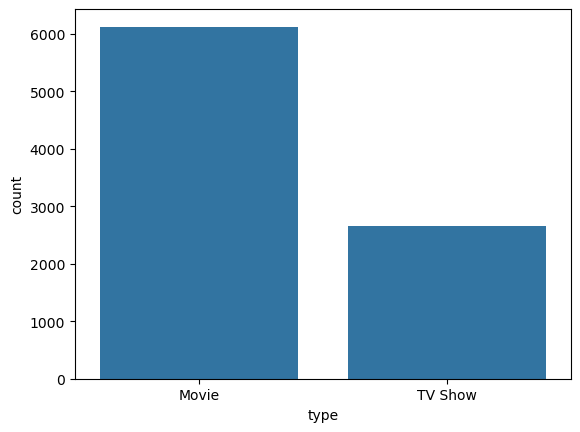

In [167]:
sns.countplot(data=df3,x="type")

In [168]:
df3["type"].value_counts()

type
Movie      6124
TV Show    2663
Name: count, dtype: int64

# Insight:- Netflix offers a significantly larger collection of movies compared to TV shows, suggesting a strong focus on film content.

# 2. director

In [171]:
director_10=df3["director"].value_counts().head(15)
director_10

director
Not Given                       2587
Rajiv Chilaka                     20
Raúl Campos, Jan Suter            18
Alastair Fothergill               18
Marcus Raboy                      16
Suhas Kadav                       16
Jay Karas                         14
Cathy Garcia-Molina               13
Martin Scorsese                   12
Jay Chapman                       12
Youssef Chahine                   12
Steven Spielberg                  11
Don Michael Paul                  10
Mark Thornton, Todd Kauffman      10
David Dhawan                       9
Name: count, dtype: int64

In [172]:
director_10.values

array([2587,   20,   18,   18,   16,   16,   14,   13,   12,   12,   12,
         11,   10,   10,    9], dtype=int64)

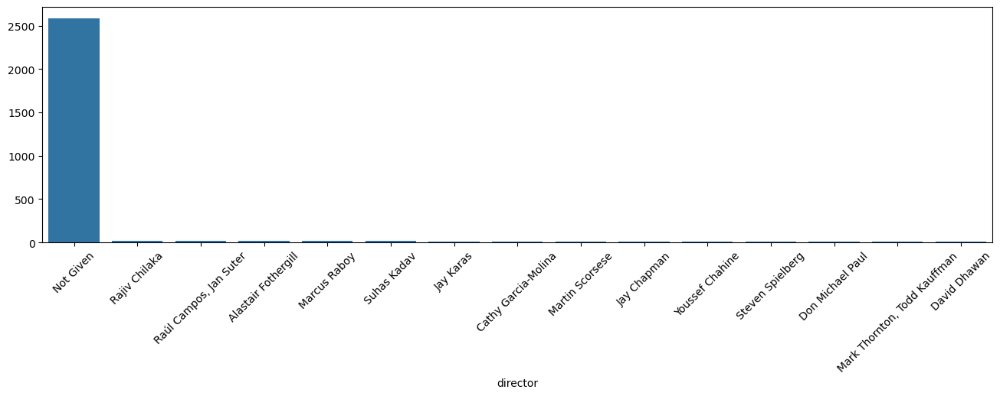

In [173]:
plt.figure(figsize=(16,4))
sns.barplot(x=director_10.index,y=director_10.values)
plt.xticks(rotation=45)
plt.show()

In [174]:
director_10.iloc[1:]

director
Rajiv Chilaka                   20
Raúl Campos, Jan Suter          18
Alastair Fothergill             18
Marcus Raboy                    16
Suhas Kadav                     16
Jay Karas                       14
Cathy Garcia-Molina             13
Martin Scorsese                 12
Jay Chapman                     12
Youssef Chahine                 12
Steven Spielberg                11
Don Michael Paul                10
Mark Thornton, Todd Kauffman    10
David Dhawan                     9
Name: count, dtype: int64

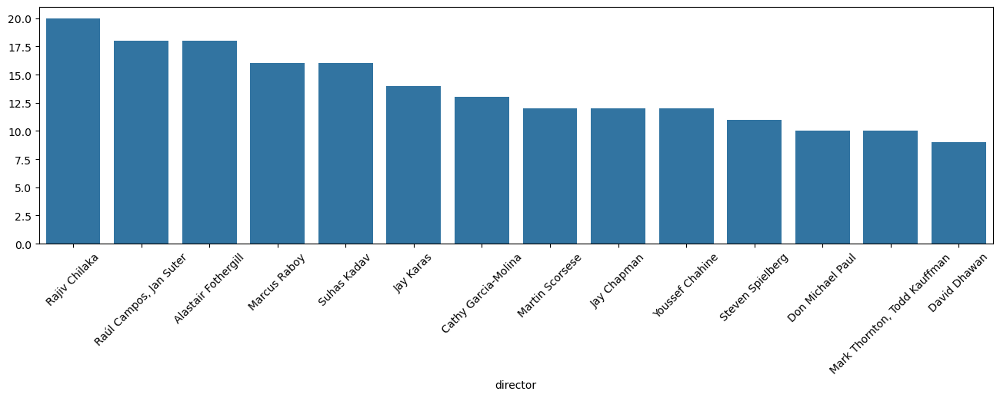

In [175]:
plt.figure(figsize=(16,4))
sns.barplot(x=director_10.iloc[1:].index,y=director_10.iloc[1:].values)
plt.xticks(rotation=45)
plt.show()

In [176]:
# 870
df3["director"].value_counts().head(870)

director
Not Given                                                     2587
Rajiv Chilaka                                                   20
Raúl Campos, Jan Suter                                          18
Alastair Fothergill                                             18
Marcus Raboy                                                    16
Suhas Kadav                                                     16
Jay Karas                                                       14
Cathy Garcia-Molina                                             13
Martin Scorsese                                                 12
Jay Chapman                                                     12
Youssef Chahine                                                 12
Steven Spielberg                                                11
Don Michael Paul                                                10
Mark Thornton, Todd Kauffman                                    10
David Dhawan                                         

# Insight: 
- we have alot of data without directors name.
- Netflix have most content of Rajiv Chilaka.
- more than 3600 directors have only one content in netflix.

# country

In [179]:
top_20_country=df3["country"].value_counts().head(20)

In [180]:
top_20_country

country
United States     3240
India             1081
United Kingdom     638
Pakistan           420
Canada             271
Not Given          263
Japan              258
South Korea        214
France             213
Spain              182
Mexico             138
Egypt              123
Australia          114
Turkey             112
Nigeria            105
Germany            104
China              100
Brazil              88
Taiwan              86
Indonesia           86
Name: count, dtype: int64

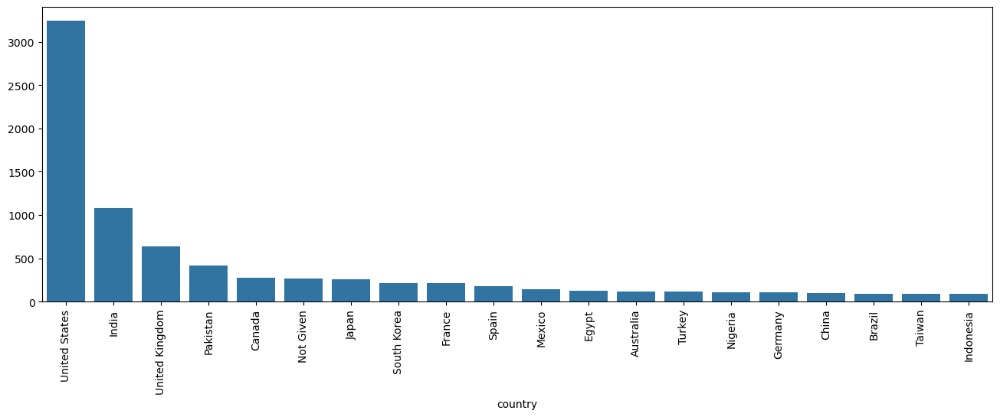

In [181]:
plt.figure(figsize=(16,5))
sns.barplot(x=top_20_country.index,y=top_20_country.values)
plt.xticks(rotation=90)
plt.show()

In [182]:
buttom_20_country=df3["country"].value_counts().tail(20)

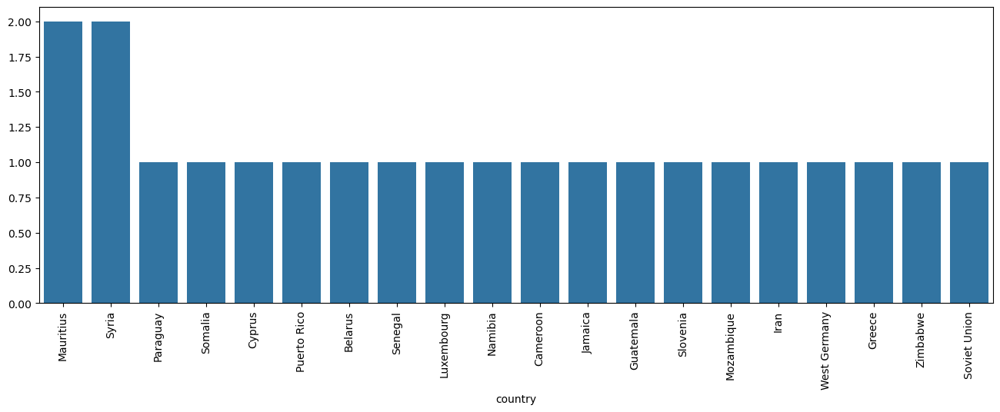

In [183]:
plt.figure(figsize=(16,5))
sns.barplot(x=buttom_20_country.index,y=buttom_20_country.values)
plt.xticks(rotation=90)
plt.show()

In [184]:
buttom_20_country

country
Mauritius       2
Syria           2
Paraguay        1
Somalia         1
Cyprus          1
Puerto Rico     1
Belarus         1
Senegal         1
Luxembourg      1
Namibia         1
Cameroon        1
Jamaica         1
Guatemala       1
Slovenia        1
Mozambique      1
Iran            1
West Germany    1
Greece          1
Zimbabwe        1
Soviet Union    1
Name: count, dtype: int64

# country Insight:-
- Netflix contain very huge amount of content of United State approx(3240) and country with in 2nd position in max content is India with (1084).
- these country have only one content 'Paraguay', 'Somalia', 'Cyprus', 'Puerto Rico','Belarus', 'Senegal', 'Luxembourg', 'Namibia', 'Cameroon', 'Jamaica','Guatemala', 'Slovenia', 'Mozambique', 'Iran', 'West Germany', 'Greece','Zimbabwe', 'Soviet Union']

# date_added

In [187]:
df3["date_added_year"]=df3["date_added"].dt.year

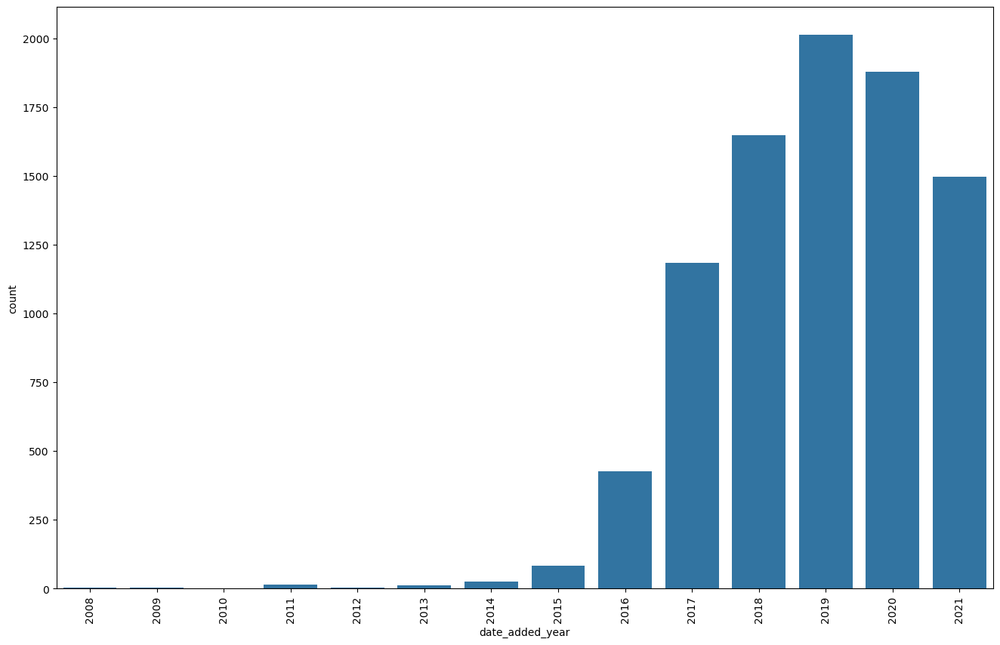

In [188]:
plt.figure(figsize=(16,10))
sns.countplot(data=df3,x="date_added_year")
plt.xticks(rotation=90)
plt.show()

# Insight date_added_year:
- The majority of the content was added between 2016 and 2021, with a significant spike in the years 2019 with value count (2014), 2020 with value count  (1879), and 2018 with value count (1647). there was rapid increase in uploading contain these years.
- during the pandemic (2020-2021), Netflix was actively adding a substantial amount of content.
- Netflix rapidly increasing their content uploding after 2015.

In [190]:
df3["date_added_month"]=df3["date_added"].dt.month

<Axes: xlabel='date_added_month', ylabel='count'>

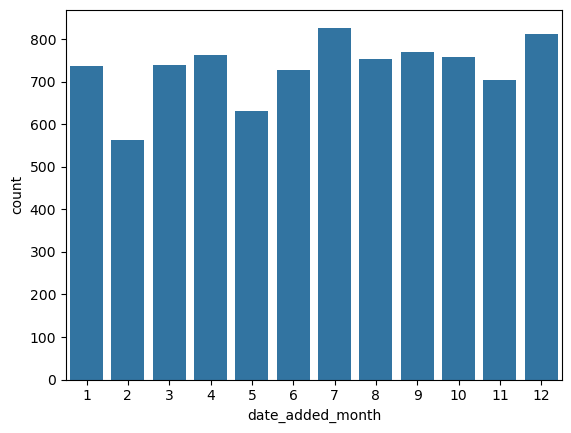

In [191]:
sns.countplot(data=df3,x="date_added_month")

<Axes: xlabel='date_added_year', ylabel='date_added_month'>

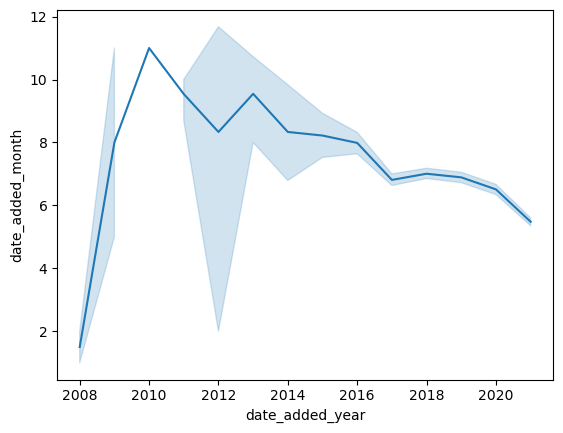

In [192]:
sns.lineplot(data=df3,x="date_added_year",y="date_added_month")

In [193]:
result=pd.crosstab(df3["date_added_year"],df3["date_added_month"])

In [194]:
result

date_added_month,1,2,3,4,5,6,7,8,9,10,11,12
date_added_year,,,,,,,,,,,,
2008,1,1,0,0,0,0,0,0,0,0,0,0
2009,0,0,0,0,1,0,0,0,0,0,1,0
2010,0,0,0,0,0,0,0,0,0,0,1,0
2011,0,0,0,0,1,0,0,0,1,11,0,0
2012,0,1,0,0,0,0,0,0,0,0,1,1
2013,0,0,1,0,0,0,0,1,2,3,2,2
2014,2,2,0,2,0,1,1,1,1,4,4,6
2015,1,4,5,5,6,6,7,2,7,14,4,21
2016,43,15,17,22,13,18,28,33,47,51,44,95


<Axes: xlabel='date_added_month'>

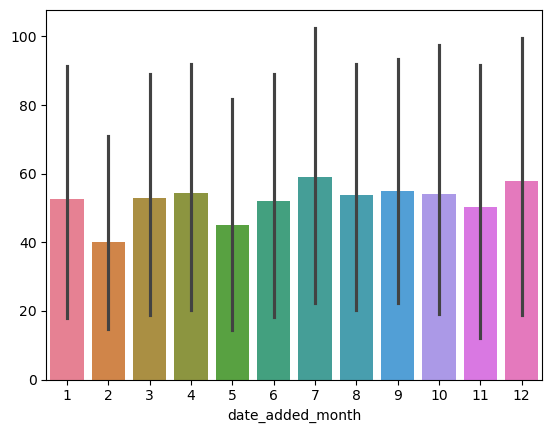

In [195]:
sns.barplot(result)

<Axes: xlabel='date_added_year'>

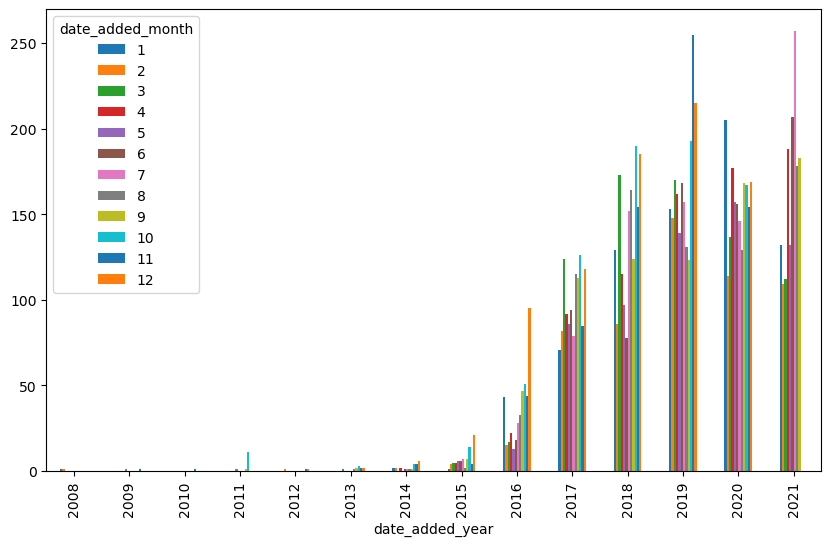

In [196]:
result.plot(kind='bar', figsize=(10, 6))

<Axes: xlabel='date_added_month', ylabel='date_added_year'>

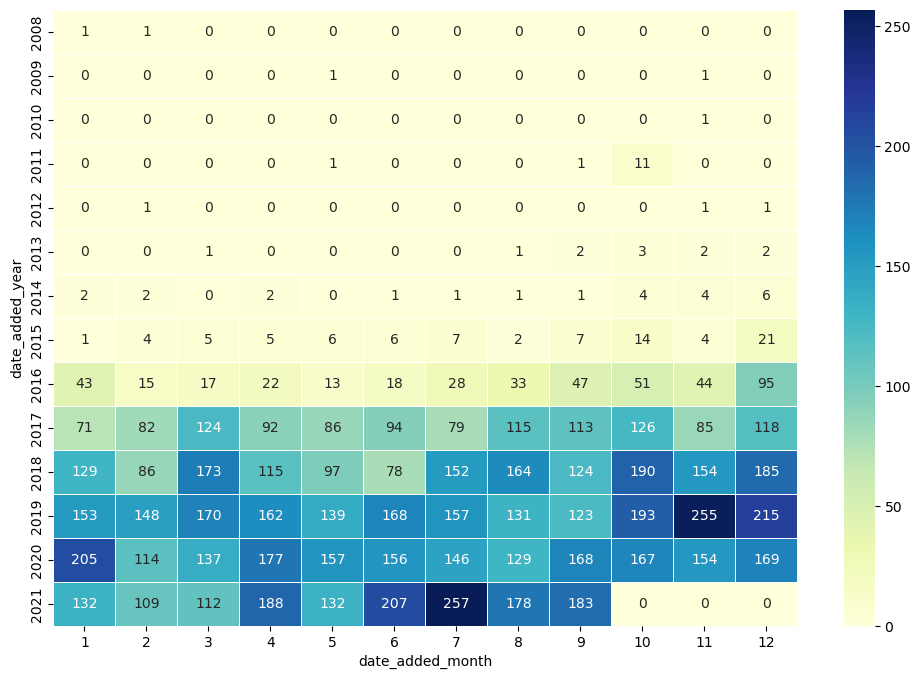

In [197]:
plt.figure(figsize=(12, 8))
sns.heatmap(result, annot=True, fmt="d", cmap="YlGnBu", linewidths=.5)

In [198]:
result1=pd.DataFrame(data=result)

In [199]:
result1=result1.transpose()

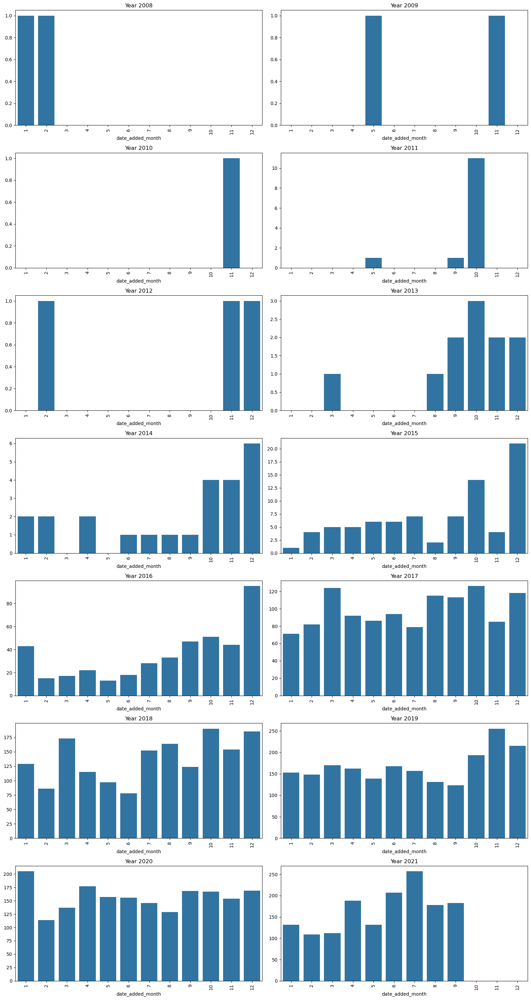

In [200]:
plt.figure(figsize=(16,30))
i=1
for year in result1.columns:
    plt.subplot(7,2,i)
    main_result=result1[year]
    i+=1
    sns.barplot(x=main_result.index,y=main_result.values)
    plt.title(f'Year {year}')
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Insight added_year:- 
- high content addition toward the end of each year, particularly in the months of October,November and December.


# release_year

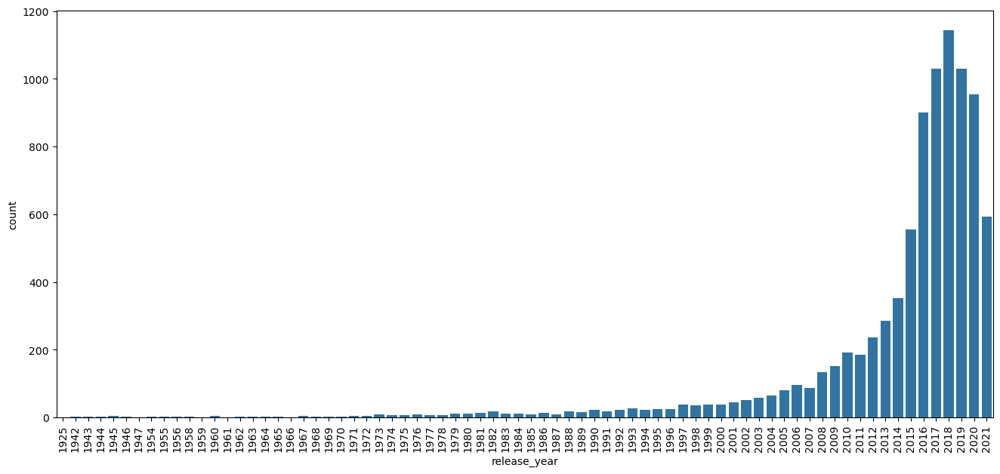

In [203]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3,x="release_year")
plt.xticks(rotation=90)
plt.show()

# Insight release_year
- hug content released during 2016 to 2020.
- the decrease in content released in 2021 it maybe due to covid-19 pandemic.

# rating

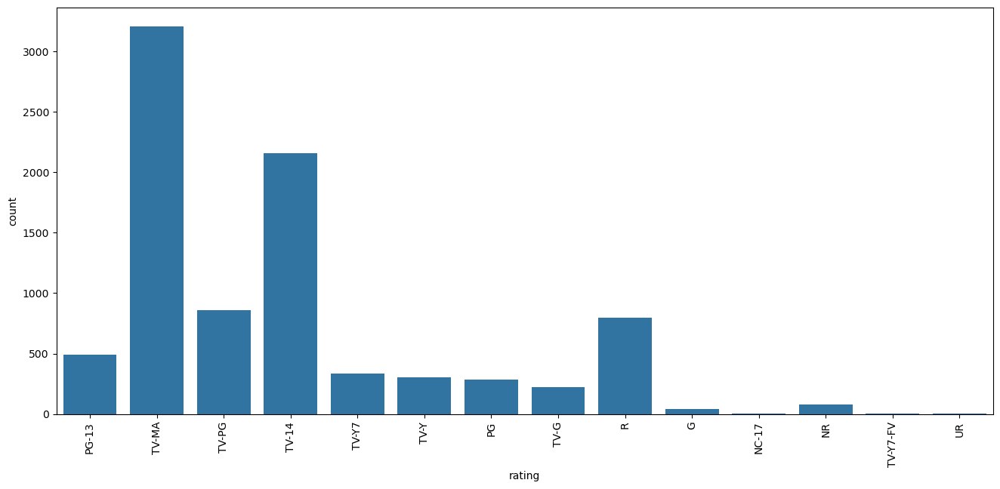

In [206]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3,x="rating")
plt.xticks(rotation=90)
plt.show()

# insight rating:-
- The prevalence of TV-MA and TV-14 ratings suggests that Netflix has a significant focus on catering to adult audiences with mature themes and content. 

In [208]:
df3["Duration1"]=df3["Duration1"].astype('int')

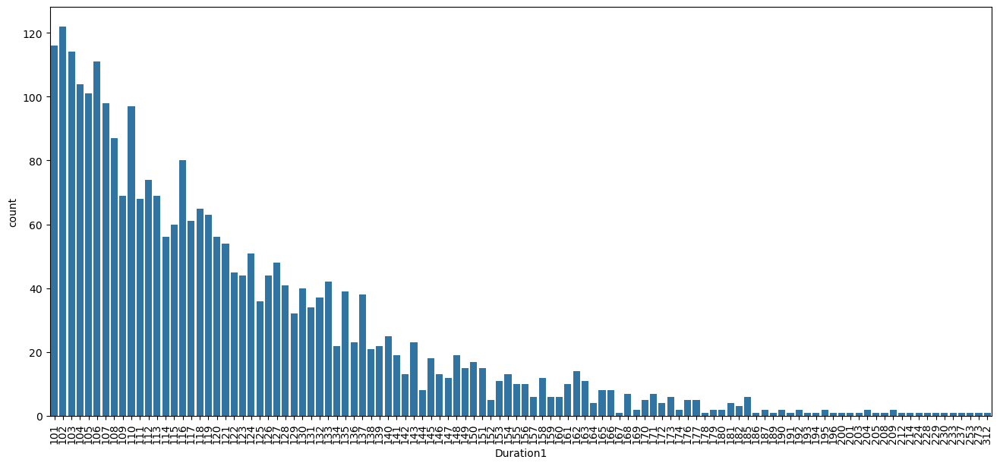

In [209]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3[df3["Duration1"]>100],x="Duration1")
plt.xticks(rotation=90)
plt.show()

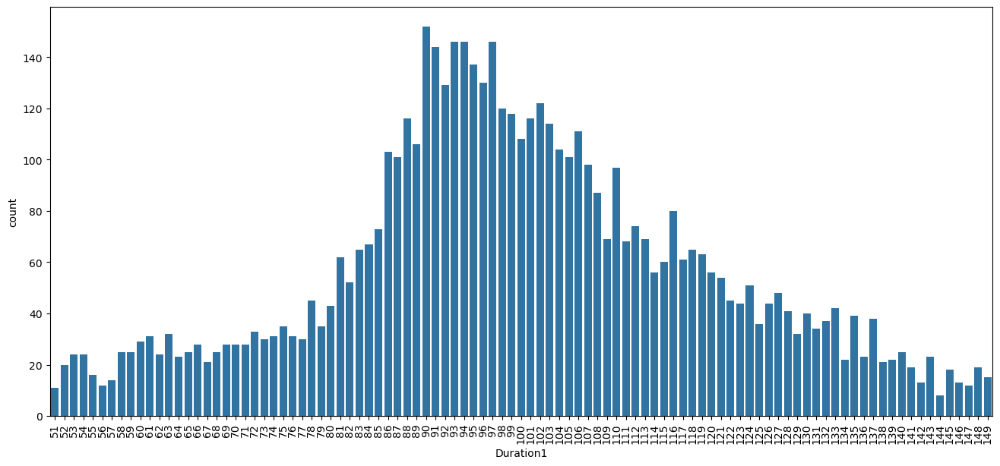

In [210]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3[(df3["Duration1"]<150)&(df3["Duration1"]>50)],x="Duration1")
plt.xticks(rotation=90)
plt.show()

# insight Duration1:-
- Most of the content are 90 mins to 105 mins.

# Seasons

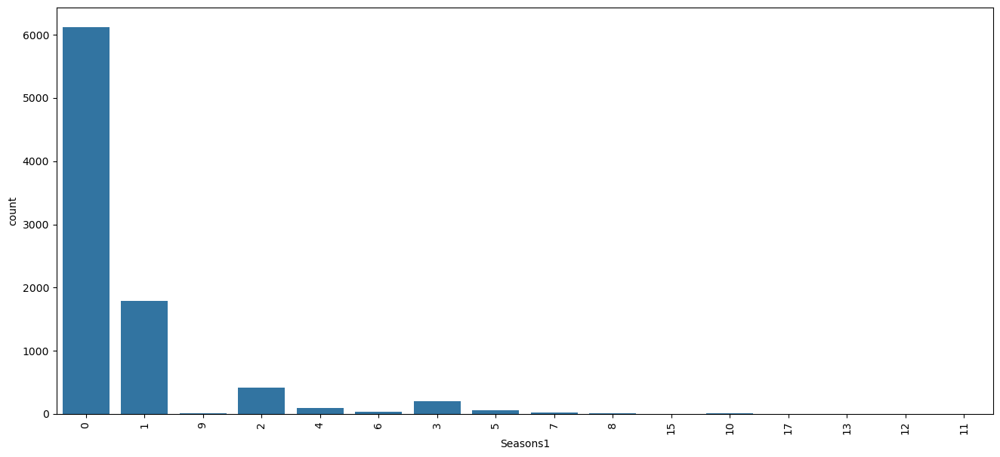

In [213]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3,x="Seasons1")
plt.xticks(rotation=90)
plt.show()

# Insight Seasons:-
- Most of the content has zero season means only one content.

<Axes: xlabel='comedies', ylabel='count'>

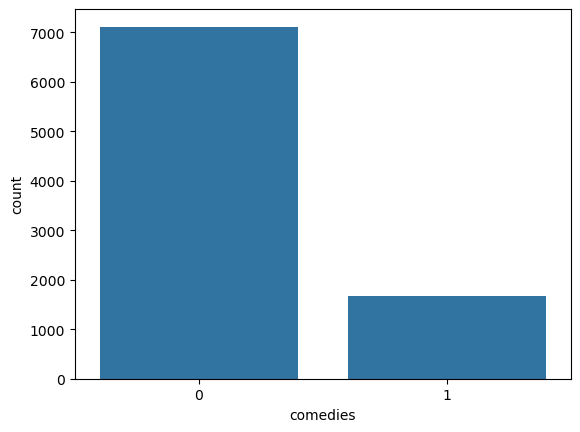

In [215]:
sns.countplot(data=df3,x="comedies")

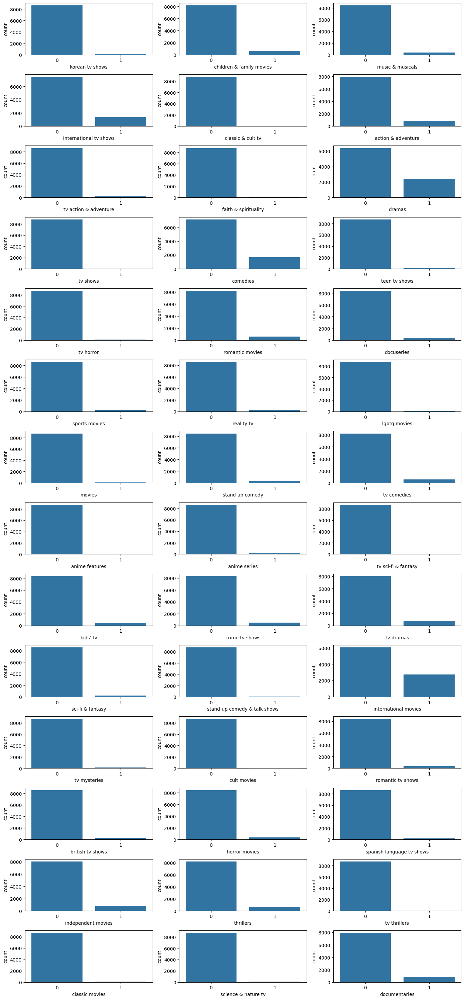

In [216]:
plt.figure(figsize=(14,30))
k=1
for i in df3.columns[12:-2]:
    plt.subplot(14,3,k)
    k+=1
    sns.countplot(data=df3,x=i)
plt.tight_layout()
plt.show()

# Insight :-
 - dramas,international movies,international TV shows,comedies are high uploaded on netflix.

# Univariate and multivariate analysis

# country and type

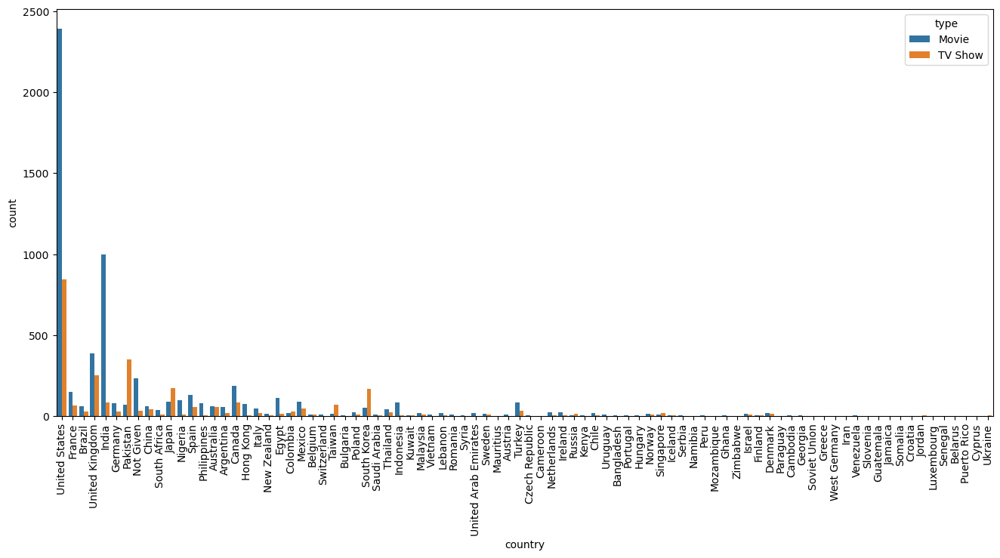

In [220]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3,x="country",hue="type")
plt.xticks(rotation=90)
plt.show()

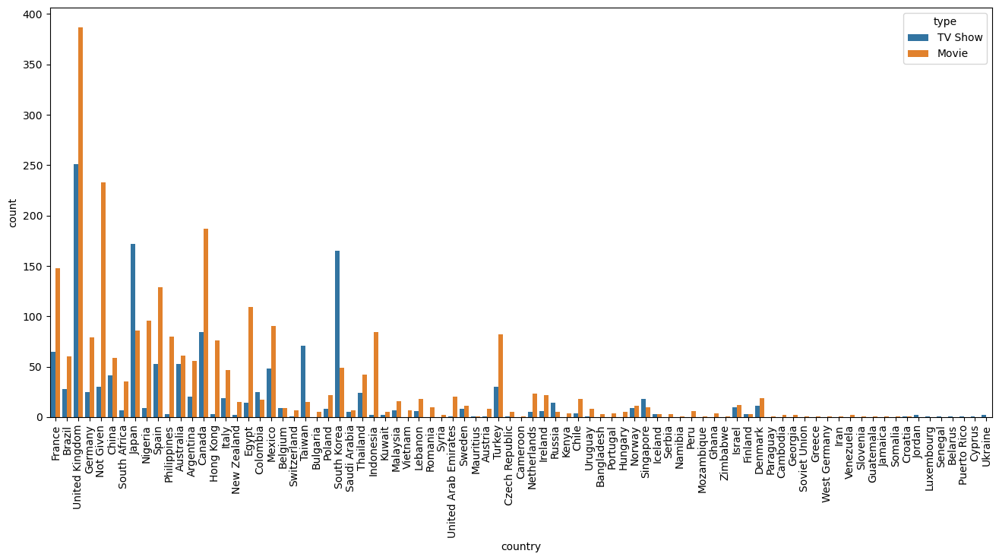

In [221]:
plt.figure(figsize=(16,7))
sns.countplot(data=df3[(df3["country"]!="United States")&(df3["country"]!="India")&(df3["country"]!="Pakistan")],x="country",hue="type")
plt.xticks(rotation=90)
plt.show()

# insight :-
- united State produce highest number of movies and TV show.
- and second highest movies content are from India.
- sencond highest TV show is from pakistan. 

In [223]:
l=df3["country"].unique()
plt.figure(figsize=(16,500))
k=1
for i in l:
    plt.subplot(86,1,k)
    k+=1
    sns.countplot(data=df3[(df3["country"]==i)],x="date_added_year",hue="type")
    plt.title(i)
plt.tight_layout()
plt.show()

# Insight:- 

United State:-
-Netflix added more movies than TV shows.

Brazil:- 
- Netflix added more movies than TV shows in earlier years, but TV shows became a bigger focus starting around 2018, reaching parity in 2020.

United kingdom:-
-Throughout all the years, more movies were added than TV shows, particularly in 2019, when movie additions reached their peak.

India:-
- throughout all the years, their were up and down in movie addition but it always be greater than TV Show addition with huge number.

Germany:-
- throughout all the years, there were almost similar addition of movies but TV Show addition increase year by year but didnot surplus movie addition.

Pakistan:-
- through out all the years, there were continous increase in movie addition but it decrease in 2020 may be due to pendamic(production delay).
- TV Show always increase year by year but number of tv show count not passes number of movie addition.

Not Given :-
- almost 120 Movies and 20 TV Show addtition had missing country name in 2021.

China :-
- throughout all the year there were up and down in quantity of both Movies and TV show addition.
- TV Show were continous increase up to 2019 and some decline seen it maybe due to pendamic.
- Movie shows continous increase up to 2018 but certain decrease in 2019 and 2020 then in 2021 it recover its addition quantity.

South Africa
- At starting only movies were added but after 2020 fews Tv shows also start adding, In 2021 there were certain decrease in both movie and TV show addition.
 
Japan:-
-Throughout the year there were continuos increase in Movie and TV show addition but in 2021 both decreases. quantity of movies addition was always greater then TV show addition.

Nigeria:-
- there were sudden a lot increase in movie addition in 2019,2020 and 2021.
- also started few addition of TV show after 2018.

Spain:-
- movie addition continous increase upto at 2019 and after it start decreasing.
- TV show addition continous increase year by year.
- netflix manage almost similar addition of Tv show in pendemic year.

Philippines:-
- Netflix's content strategy in the Philippines has been largely focused on adding movies, with little attention to TV shows.

Australia:-
- upto 2018 Movies netflix more focus on movies but after their more focus shift to TV shows. 

Argentina:-
- at starting more focus on Movies but after 2018 focus on movie slightly shift to TV show.

Camda:-
- Largely focus on Movies
- continous slight increase in TV show addition year by year.

Hong Kong:-
- peak in 2018 but after that continous high decrease occured in movie addition 

Italy :-
- basically focus on movies addition but after 2019 focus partially distribute with TV show addition.

New Zealand:-
- fully focus on movie addition and movie addition increase continously but in 2019 it drops.
- netflix try TV show addtion in 2018 and 2019 but after it not add any TV show.

Egypt:-
- particular focus on movies.
- The highest number of movies and TV shows from Egypt were added to Netflix in 2019 and 2020.

Colombia:-
- Netflix more focus on TV shows compare to Movies.
- Movie addition were started in 2018 but TV show addition started in 2016.

Mexico:-
- focus on Movies Addition was continous decreasing.
- Tv show addition goes up and down both.

Belgium:-
- there was peak in 2017 and 2021 in movie addition.
- and there was continous increase one by one in TV show addition per year.

Switzerland:-
- Mainly target on Movies addtion.
- Last time TV show added in 2016.

Taiwan:-
- TV show addition continous decreasing but only go few high on 2019 and goes peak on 2016.
- Movie addition was start continous increase after 2018.

Bulgaria:-
- only focus on movies.

Poland:-
- TV show addition increase continously.
- peak of movie addition was at 2019 and Movie addition decrease after 2019.
-  every year number of movie addition is more than number of TV show addition.

South Korea:-
- netflix focus on TV shows from south korea.
- their was a peak of Tv show addition was at 2019 was 45+ , and highest peak of movie addition goes in 2018 was approx 13.

Saudi Arabia:-
-In this country one Movie comes in 2017 and take a break of one year for movie addition and Tv shows comes in 2018.
- highest peak of movie addition was 2020 with 5 movies and Tv shows with 3 shows in 2020.

Thailand:-
- Movies addition decrease year by year.
- but Tv shows addition goes up and down both.

Indonesia:-
- Only focusing on Movies.

Kuwait
- At start one TV show added in 2019 and 2020.
- peak of movie addition were at 2020 and then decrease.

Malaysia:-
- More focus on Movies addition, In pendamic it added highest of movies addition of Malaysia.

Vietnam:
- Only focus on Movies

Lebanon:-
cureently they were focusing on Movie.

Romania:-
- focus only on movie and peak in 2020.

syria:-
- In 2021 they were start adding movies only.

United Arab Emirates:
- The highest number of movies from the United Arab Emirates were added to Netflix in 2020.
- they also started adding TV shows in 2021.

Sweden:-
- consistence focus on both Movie and TV shows.

Mauritius:-
-  One Tv show added in 2019 and one Movie added in 2021.

Austria:-
- More focus on Movies and in 2019 it achieve their high peak of adding 3 movies.

Turkey:-
- addition of movies were increases year by year.
- but Tv shows addition remain almost constant.

Russia:-
- year by year TV show addition decreases.
- movies remain almost same with 1 addition in a year.

Kenya
- only movies addition.

Chile:-
- with continous increase in movies addition till 2018 then it drop to 1 and 2 addition in a year.

Uruguay:-
- more focus on Movies but in 2021 netflix added both one movie and one TV show.

Bangladesh,Portugal,Hungary:-
- was focus on Movie only. 
- fews movies addition.

Norway:-
- both addition quantities goes little up and down. but high peak of adding movie were at 2017 with 4  movies addition.

Singapore:-
- Both Movie and TV shows Addition decreases year by year.

Israel:-
- In past they were showing more interest on Movies addition but after 2019 netflix only added Tv shows.

Denmark:-
- past interest is on movies but interest changes to Tv shows addition.



# country,type and date_added_month

In [226]:
l=df3["country"].unique()
plt.figure(figsize=(16,500))
k=1
for i in l:
    plt.subplot(86,1,k)
    k+=1
    sns.countplot(data=df3[(df3["country"]==i)],x="date_added_month",hue="type")
    plt.title(i)
plt.tight_layout()
plt.show()

# Insight of country,type and added_month month
United states:-
- The highest number of movies from the United States were added to Netflix in January month.
- Tv shows remained relatively consistent each month.

France:-
- The highest number of movies from the France were added to Netflix in October month.
- The lower number of TV shows from the France were added to Netflix in middle month means May, June, July and August.

Brazil:-
- The high number of movies from the Brazil were added to Netflix in the month of january,April,June and November.
- the high number of TV shows are added in month of November.

United Kingdom:-
-  The lower number of movies from the United Kingdom were added to Netflix in middle months.

India:-
- The high number of movies from the India were added to Netflix in March,April and December months.

Germany:- 
-  The highest number of movies from the Germany were added to Netflix in April month and lowest in 1st,2nd,4th,5th,and 8th month.

Pakistan:-
-  The high number of movies from the Pakistan were added to Netflix in middle months.

Not given:-
- mostly July month movie type data contain null value in contry features.

China:- 
-  The high number of movies from the china were added to Netflix in middle month like 4,5,7,9 months.
- High number of TV show were added to netflix in 7th and 10th month.

Japan:-
-  The high number of movies from the Japan were added to Netflix in september month and low in August month.

Philippines:
-  The highest number of movies from the Philippines were added to Netflix in March month.

Canada:-
- The high number of movies from the Canada were added to Netflix in last 3 months and 3rd month.

Hong kong:
-  The highest number of movies from the Hong kong were added to Netflix in 8 month.

Egypt:-
- The highest number of movies from the Egypt were added to Netflix in May month.

South korea:-
-  The highest number of TV shows from the South korea were added to Netflix in December month and movie in January month.




# Release_year and Rating

C:\Users\maury\AppData\Local\Temp\ipykernel_5720\382381335.py:2: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df3[df3["release_year"]>2014],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])


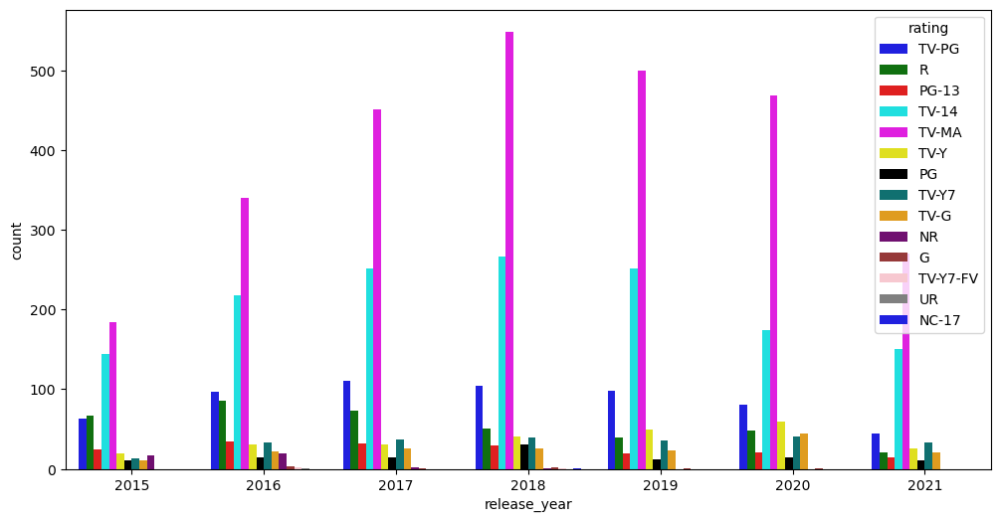

In [467]:
plt.figure(figsize=(12,6))
sns.countplot(data=df3[df3["release_year"]>2014],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])
plt.show()

In [ ]:
# we remove few rating for clear visualise rest of the rating

C:\Users\maury\AppData\Local\Temp\ipykernel_5720\3592186459.py:2: UserWarning: The palette list has more values (13) than needed (12), which may not be intended.
  sns.countplot(data=df3[(df3["release_year"]>2014)& (df3["rating"]!="TV-MA")&(df3["rating"]!="TV-14")],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])


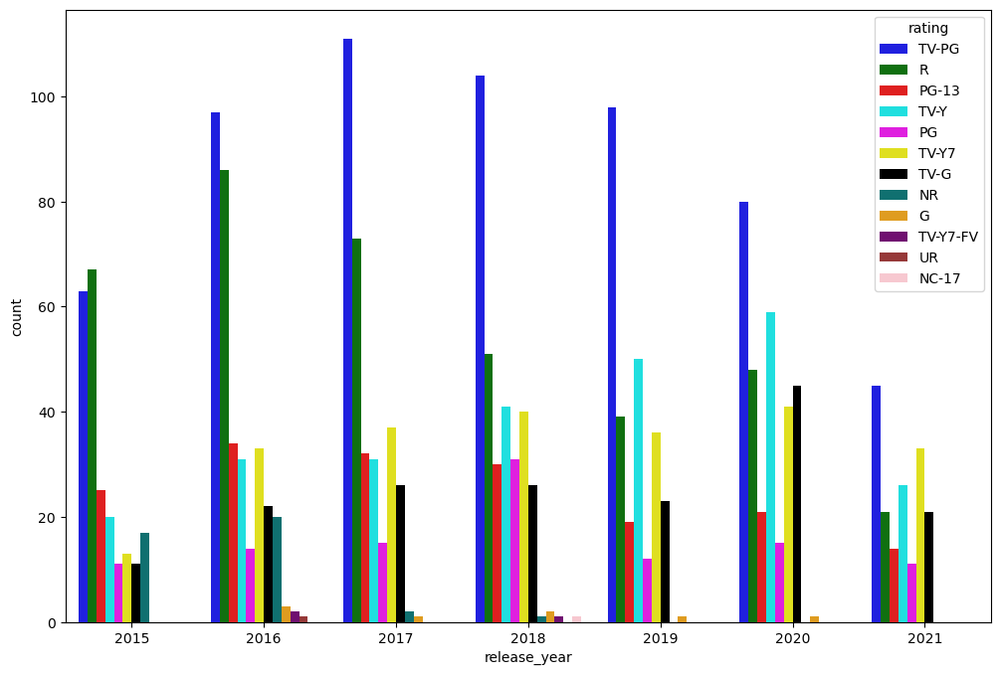

In [469]:
plt.figure(figsize=(12,8))
sns.countplot(data=df3[(df3["release_year"]>2014)& (df3["rating"]!="TV-MA")&(df3["rating"]!="TV-14")],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])
plt.show()

C:\Users\maury\AppData\Local\Temp\ipykernel_5720\1689190218.py:2: UserWarning: The palette list has more values (13) than needed (9), which may not be intended.
  sns.countplot(data=df3[(df3["release_year"]>2014)& (df3["rating"]!="TV-MA")&(df3["rating"]!="TV-14")&(df3["rating"]!="TV-PG")&(df3["rating"]!="R")&(df3["rating"]!="TV-Y")],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])


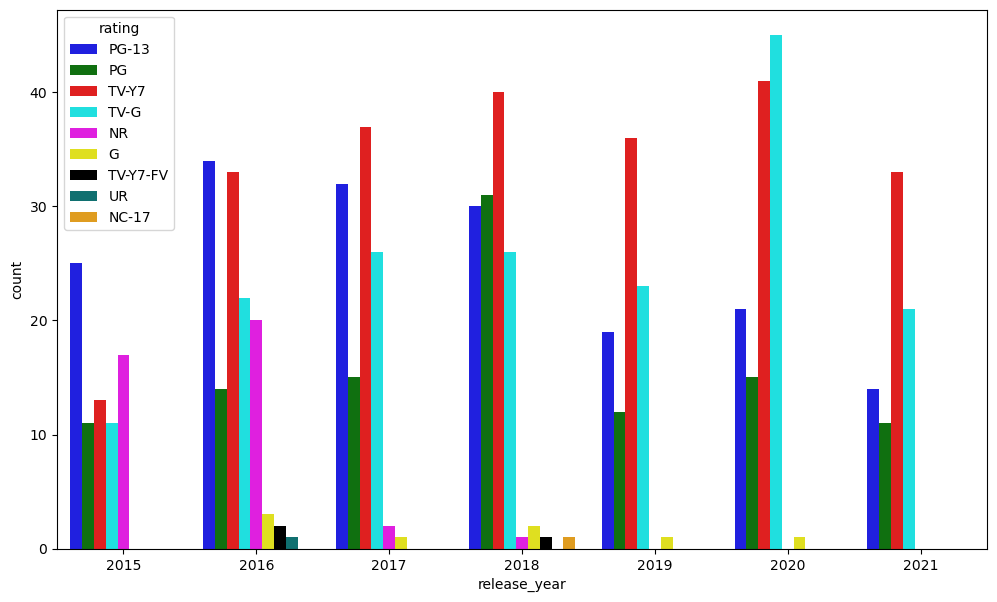

In [471]:
plt.figure(figsize=(12,7))
sns.countplot(data=df3[(df3["release_year"]>2014)& (df3["rating"]!="TV-MA")&(df3["rating"]!="TV-14")&(df3["rating"]!="TV-PG")&(df3["rating"]!="R")&(df3["rating"]!="TV-Y")],x="release_year",hue="rating",palette=['blue','green','red','cyan','magenta','yellow','black','teal','orange','purple','brown','pink','gray'])
plt.show()

# Insight release_year
- Netflix has consistently maintained a high volume of TV-MA rated content, indicating a significant focus on mature audiences 
- Netflix has seen a decline in R-rated content, suggesting a potential shift in audience preferences 
- Netflix has experienced a consistent rise in TV-Y rated content, indicating a growing focus for children of all ages
- Netflix saw a big jump in TV shows and movies rated TV-G in 2020. This shows that more people are looking for shows and movies that are good for the whole family.
- Netflix has experienced a steady increase in TV-Y rated content.means target young audience also.
- Netflix has generally seen a decline in PG-13 rated content, there was a slight uptick in 2020, potentially due to increased family viewership during the COVID-19 pandemic.
- There has been a consistent decline in the number of films released without an official MPAA rating, suggesting a growing trend towards seeking official ratings for broader distribution and audience appeal.

# Country and Duration1

# - For both type Movie and TV Show 

In [336]:
dic={}
country_name=df3.country.unique()
for i in country_name: 
    dic[i]=np.round(df3[df3["country"]==i]["Duration1"].mean(),2)
print(dic)

{'United States': 67.58, 'France': 66.94, 'Brazil': 61.43, 'United Kingdom': 57.06, 'India': 115.65, 'Germany': 73.81, 'Pakistan': 12.12, 'Not Given': 78.97, 'China': 63.68, 'South Africa': 79.81, 'Japan': 31.55, 'Nigeria': 96.51, 'Spain': 71.85, 'Philippines': 107.31, 'Australia': 49.51, 'Argentina': 65.76, 'Canada': 60.18, 'Hong Kong': 95.49, 'Italy': 71.38, 'New Zealand': 93.88, 'Egypt': 95.11, 'Colombia': 32.19, 'Mexico': 57.76, 'Belgium': 49.22, 'Switzerland': 82.38, 'Taiwan': 18.22, 'Bulgaria': 94.4, 'Poland': 70.77, 'South Korea': 25.37, 'Saudi Arabia': 56.92, 'Thailand': 67.27, 'Indonesia': 106.29, 'Kuwait': 77.43, 'Malaysia': 68.7, 'Vietnam': 106.29, 'Lebanon': 64.96, 'Romania': 121.7, 'Syria': 51.5, 'United Arab Emirates': 88.38, 'Sweden': 50.89, 'Mauritius': 44.5, 'Austria': 87.89, 'Turkey': 78.4, 'Czech Republic': 86.0, 'Cameroon': 143.0, 'Netherlands': 75.46, 'Ireland': 74.46, 'Russia': 26.26, 'Kenya': 90.5, 'Chile': 75.86, 'Uruguay': 73.89, 'Bangladesh': 111.67, 'Portugal

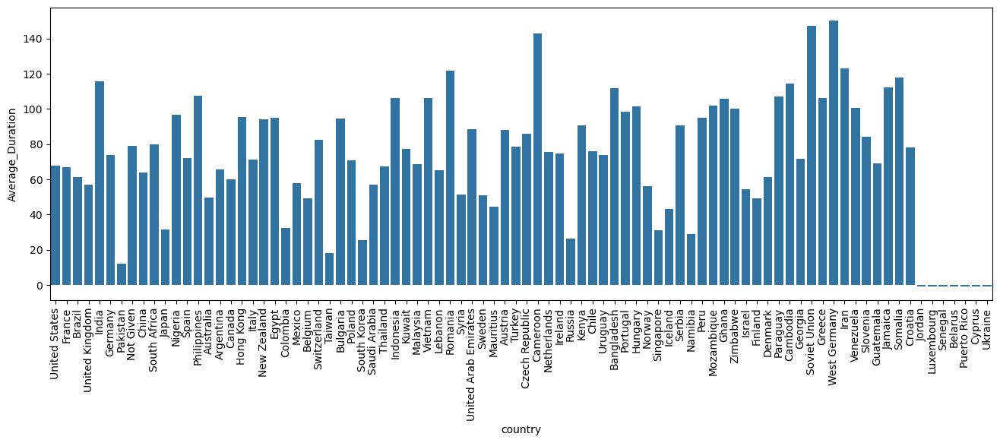

In [338]:
plt.figure(figsize=(16,5))
sns.barplot(x=dic.keys(),y=dic.values())
plt.xticks(rotation=90)
plt.xlabel("country")
plt.ylabel("Average_Duration")
plt.show()

# - For Movie

In [344]:
dic_movie={}
country_name=df3.country.unique()
for i in country_name: 
    dic_movie[i]=np.round(df3[(df3["country"]==i)&(df3["type"]=="Movie")]["Duration1"].mean(),2)
print(dic_movie)

{'United States': 91.78, 'France': 96.78, 'Brazil': 90.57, 'United Kingdom': 94.72, 'India': 125.1, 'Germany': 97.48, 'Pakistan': 76.63, 'Not Given': 89.26, 'China': 108.63, 'South Africa': 95.97, 'Japan': 96.65, 'Nigeria': 105.66, 'Spain': 101.78, 'Philippines': 111.38, 'Australia': 93.39, 'Argentina': 89.61, 'Canada': 87.66, 'Hong Kong': 99.3, 'Italy': 100.64, 'New Zealand': 106.53, 'Egypt': 107.45, 'Colombia': 81.0, 'Mexico': 89.1, 'Belgium': 99.44, 'Switzerland': 94.29, 'Taiwan': 109.2, 'Bulgaria': 94.4, 'Poland': 96.86, 'South Korea': 114.18, 'Saudi Arabia': 98.29, 'Thailand': 106.29, 'Indonesia': 108.85, 'Kuwait': 108.8, 'Malaysia': 99.19, 'Vietnam': 106.29, 'Lebanon': 86.94, 'Romania': 121.7, 'Syria': 51.5, 'United Arab Emirates': 92.85, 'Sweden': 88.64, 'Mauritius': 90.0, 'Austria': 99.0, 'Turkey': 107.45, 'Czech Republic': 103.4, 'Cameroon': 143.0, 'Netherlands': 92.09, 'Ireland': 95.05, 'Russia': 102.6, 'Kenya': 90.5, 'Chile': 92.94, 'Uruguay': 83.25, 'Bangladesh': 111.67, 'P

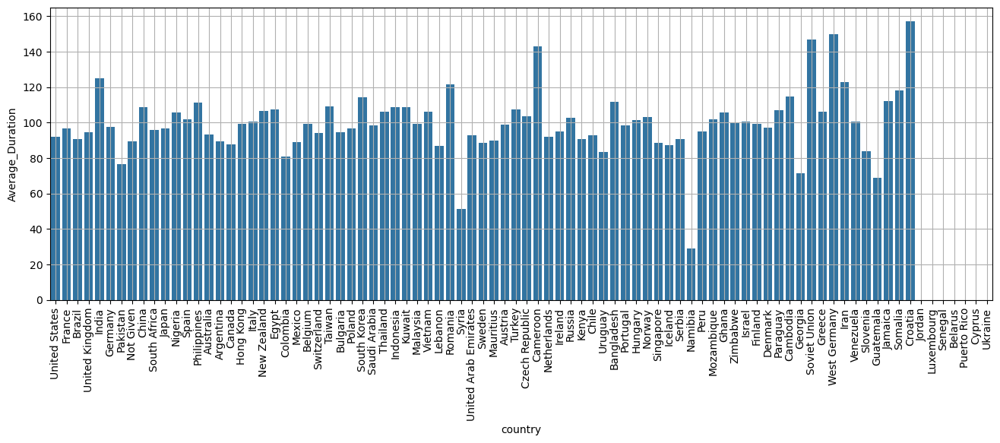

In [377]:
plt.figure(figsize=(16,5))
sns.barplot(x=dic_movie.keys(),y=dic_movie.values())
plt.xticks(rotation=90)
plt.grid()
plt.xlabel("country")
plt.ylabel("Average_Duration")
plt.show()

# Insight:- 
- Croatia, West Germany, Soviet Union, Cameroon, India, Iran, Romania has more than 120 minutes Average Duration of Movies.
- lowest Average Duration of Movies was of Namibia country with 35 minute and Syria with 52 minutes Average Duration approx.

# - For TV Show

In [362]:
dic_tv_Show={}
country_name=df3.country.unique()
for i in country_name: 
    dic_tv_Show[i]=df3[(df3["country"]==i)&(df3["type"]=="TV Show")]["Duration1"].mean()
print(dic_tv_Show)

{'United States': -1.0, 'France': -1.0, 'Brazil': -1.0, 'United Kingdom': -1.0, 'India': -1.0, 'Germany': -1.0, 'Pakistan': -1.0, 'Not Given': -1.0, 'China': -1.0, 'South Africa': -1.0, 'Japan': -1.0, 'Nigeria': -1.0, 'Spain': -1.0, 'Philippines': -1.0, 'Australia': -1.0, 'Argentina': -1.0, 'Canada': -1.0, 'Hong Kong': -1.0, 'Italy': -1.0, 'New Zealand': -1.0, 'Egypt': -1.0, 'Colombia': -1.0, 'Mexico': -1.0, 'Belgium': -1.0, 'Switzerland': -1.0, 'Taiwan': -1.0, 'Bulgaria': nan, 'Poland': -1.0, 'South Korea': -1.0, 'Saudi Arabia': -1.0, 'Thailand': -1.0, 'Indonesia': -1.0, 'Kuwait': -1.0, 'Malaysia': -1.0, 'Vietnam': nan, 'Lebanon': -1.0, 'Romania': nan, 'Syria': nan, 'United Arab Emirates': -1.0, 'Sweden': -1.0, 'Mauritius': -1.0, 'Austria': -1.0, 'Turkey': -1.0, 'Czech Republic': -1.0, 'Cameroon': nan, 'Netherlands': -1.0, 'Ireland': -1.0, 'Russia': -1.0, 'Kenya': nan, 'Chile': -1.0, 'Uruguay': -1.0, 'Bangladesh': nan, 'Portugal': nan, 'Hungary': nan, 'Norway': -1.0, 'Singapore': -1.0

# conclusion:- we don't have duration for TV show we have Season for that 

In [373]:
dic_tv_Show={}
country_name=df3.country.unique()
for i in country_name: 
    dic_tv_Show[i]=df3[(df3["country"]==i)&(df3["type"]=="TV Show")]["Seasons1"].mean()
print(dic_tv_Show)

{'United States': 2.2958579881656807, 'France': 1.5538461538461539, 'Brazil': 1.2857142857142858, 'United Kingdom': 1.8605577689243027, 'India': 1.1728395061728396, 'Germany': 1.32, 'Pakistan': 1.2578796561604584, 'Not Given': 1.0333333333333334, 'China': 1.146341463414634, 'South Africa': 1.2857142857142858, 'Japan': 1.569767441860465, 'Nigeria': 1.3333333333333333, 'Spain': 1.7924528301886793, 'Philippines': 1.0, 'Australia': 2.0, 'Argentina': 1.35, 'Canada': 2.607142857142857, 'Hong Kong': 1.0, 'Italy': 1.631578947368421, 'New Zealand': 1.5, 'Egypt': 1.0, 'Colombia': 1.08, 'Mexico': 1.5208333333333333, 'Belgium': 1.3333333333333333, 'Switzerland': 1.0, 'Taiwan': 1.0140845070422535, 'Bulgaria': nan, 'Poland': 1.5, 'South Korea': 1.2, 'Saudi Arabia': 1.8, 'Thailand': 1.4583333333333333, 'Indonesia': 1.5, 'Kuwait': 1.0, 'Malaysia': 1.8571428571428572, 'Vietnam': nan, 'Lebanon': 1.0, 'Romania': nan, 'Syria': nan, 'United Arab Emirates': 3.0, 'Sweden': 1.25, 'Mauritius': 1.0, 'Austria': 

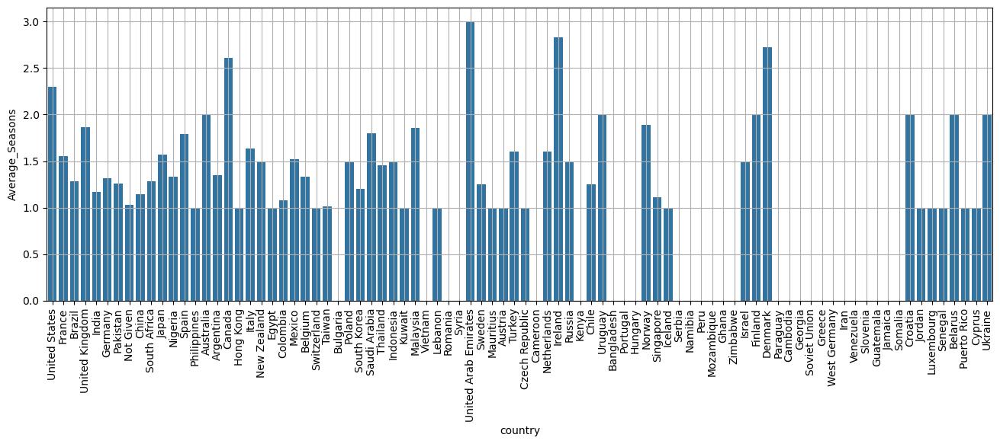

In [383]:
plt.figure(figsize=(16,5))
sns.barplot(x=dic_tv_Show.keys(),y=dic_tv_Show.values())
plt.xticks(rotation=90)
plt.grid()
plt.xlabel("country")
plt.ylabel("Average_Seasons")
plt.show()

# Insight:- 
- United Arab Emirates,Ieland,Denmark,Canada,United States was more the 2 average Season.

# country, listed_in, type

In [400]:
col_name=df3.columns[12:-2]

In [447]:
country_name=df3["country"].unique()[:20]

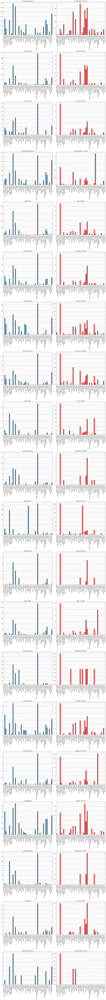

In [457]:
p=1
plt.figure(figsize=(16,150))
for con in country_name:
    dic_listed_in_Movies={}
    dic_listed_in_TVShow={}
    for col in col_name:
        dic_listed_in_Movies[col]=df3[(df3["country"]==con)&(df3["type"]=="Movie")][col].sum()
        dic_listed_in_TVShow[col]=df3[(df3["country"]==con)&(df3["type"]=="TV Show")][col].sum()

    # display barplot
    plt.subplot(20,2,p)
    sns.barplot(x=dic_listed_in_Movies.keys(),y=dic_listed_in_Movies.values())
    p+=1
    plt.title(con+" Movie")
    plt.grid()
    plt.xticks(rotation=90)
    plt.subplot(20,2,p)
    sns.barplot(x=dic_listed_in_TVShow.keys(),y=dic_listed_in_TVShow.values(),color="red")
    p+=1
    plt.title(con+ " TV Show")
    plt.grid()
    plt.xticks(rotation=90)
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

# Local Insight:-
# United States:
- Movies: Popular genres include Dramas (680), Comedies (620), Documentaries (460), Children & Family Movies (350), Action & Adventure (320), and # Independent Movies (325).
- TV Shows: TV Comedies (240), TV Dramas (210), Kids' TV (185), and Docuseries (175) dominate.
# France:
- Movies: International Movies (118) and Dramas (72) are most popular.
- TV Shows: International TV Shows (38), Kids' TV (24), and TV Dramas (23) lead.
# Brazil:
- Movies: International Movies (40), Dramas (22), and Comedies (18) are prominent.
- TV Shows: International TV Shows (26), TV Dramas (11) stand out.
# United Kingdom:
- Movies: Dramas (135), International Movies (128), and Documentaries (105) are top genres.
- TV Shows: British TV Shows (225) and International TV Shows (125) are popular.
# India:
- Movies: International Movies (900) and Dramas (680) are the most popular.
- TV Shows: International TV Shows (65), TV Dramas (28), and TV Comedies (26).
# Germany:
- Movies: International Movies (46), Dramas (28).
- TV Shows: International TV Shows (24), TV Dramas (14).
# Pakistan:
- Movies: International Movies (26), Dramas (17).
- TV Shows: International TV Shows (200), TV Dramas (90).
# China:
- Movies: International Movies (48), Action & Adventure (32).
- TV Shows: International TV Shows (38), Romantic TV Shows (20), TV Dramas (18).
# Japan:
- Movies: International Movies (63), Anime Features (58), Action & Adventure (48).
- TV Shows: International TV Shows (142), Anime Series (132).
# Nigeria:
- Movies: International Movies (88), Dramas (66), Comedies (42).
- TV Shows: International TV Shows (9), TV Dramas (7).
# Spain:
- Movies: International Movies (115), Dramas (55).
- TV Shows: International TV Shows (48), Spanish-language TV Shows (38), Crime TV Shows (24).
# South Africa:
- Movies: International Movies (28).
- TV Shows: International TV Shows (7), TV Dramas (6).
# Philippines:
- Movies: International Movies (78), Dramas (52).
- TV Shows: International TV Shows (2).
# Australia:
- Movies: Dramas (23), International Movies (23), Children & Family Movies (14).
- TV Shows: International TV Shows (28), TV Dramas (17).
# Argentina:
- Movies: International Movies (45), Dramas (26).
- TV Shows: International TV Shows (16), Spanish-language TV Shows (18).
# Canada:
- Movies: International Movies (40), Comedies (55), Dramas (45), Children & Family Movies (40).
- TV Shows: International TV Shows (23), Kids' TV (35), TV Dramas (25), TV Comedies (22).
# Hong Kong:
- Movies: International Movies (65), Action & Adventure (50).
- TV Shows: International TV Shows (3), TV Dramas (3).
# Italy:
- Movies: International Movies (38), Dramas (22).
- TV Shows: International TV Shows (12), TV Dramas (12).
# New Zealand:
- Movies: Dramas (7), International Movies (4), Action & Adventure (4), Documentaries (4).
- TV Shows: International TV Shows (2).

# OverAll_insight:- 
- International Movies and TV Shows dominate across many countries, with specific genre preferences varying by country, such as anime in Japan and British TV Shows in the UK.

In [477]:
df3.sample(4)

,show_id,type,title,director,country,date_added,release_year,rating,duration,listed_in,Duration1,Seasons1,korean tv shows,children & family movies,music & musicals,international tv shows,classic & cult tv,action & adventure,tv action & adventure,faith & spirituality,dramas,tv shows,comedies,teen tv shows,tv horror,romantic movies,docuseries,sports movies,reality tv,lgbtq movies,movies,stand-up comedy,tv comedies,anime features,anime series,tv sci-fi & fantasy,kids' tv,crime tv shows,tv dramas,sci-fi & fantasy,stand-up comedy & talk shows,international movies,tv mysteries,cult movies,romantic tv shows,british tv shows,horror movies,spanish-language tv shows,independent movies,thrillers,tv thrillers,classic movies,science & nature tv,documentaries,date_added_year,date_added_month
7005,s1739,Movie,A Christmas Catch,Not Given,Canada,2020-11-04,2018,TV-G,87 min,"Dramas, Romantic Movies",87,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020,11
2762,s3663,Movie,"Frankenstein’s Monster’s Monster, Frankenstein",Daniel Gray Longino,United States,2019-07-16,2019,TV-14,32 min,Comedies,32,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019,7
5354,s7338,Movie,Lorai: Play to Live,Parambrata Chatterjee,India,2017-09-01,2015,TV-14,155 min,"Dramas, International Movies, Sports Movies",155,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2017,9
3007,s4092,Movie,The Drug King,Woo Min-ho,South Korea,2019-02-21,2018,TV-MA,139 min,"Dramas, International Movies, Thrillers",139,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,2019,2


# This project revealed several key insights into Netflix's content strategy and trends:

- Content Growth: Netflix's content catalog has grown significantly, especially between 2016 and 2020, with a focus on adding more movies than TV shows.

- Country-specific Insights: The United States and India are the largest contributors to Netflix’s library, with the U.S. dominating in terms of sheer volume. Other countries like the UK, Brazil, and Japan have also shown a steady increase in content.

- Genres and Ratings: Netflix caters to a wide audience, but there's a clear focus on adult-oriented content (TV-MA, TV-14), while family-friendly content has seen a slight increase since 2020.

- Duration Trends: Most movies on Netflix are about 90-105 minutes long. For TV shows, a significant number of titles listed actually have zero seasons, likely representing one-off specials or miniseries.

- Global Reach: Netflix's strategy includes adding content from diverse countries and genres, which helps it cater to a global audience.

In [ ]:
---**** end 